In [1]:
import pickle
from string import punctuation

import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
import numpy as np
import json
import dask.bag as db

In [1366]:
# Load the data
import logging
logger = logging.getLogger("spacy")
logger.setLevel(logging.ERROR)

import dask.bag as db
import json

docs = db.read_text('../Data/arxiv-metadata-oai-snapshot.json').map(json.loads)

In [1593]:
# Trimming the data
get_latest_version = lambda x: x['versions'][-1]['created']


# get only necessary fields of the metadata file
trim = lambda x: {'id': x['id'],
                  'versions': x['versions'],
                  'category':x['categories'].split(' '),
                  'abstract':x['abstract'],}

# filter for papers published before 2022
columns = ['id','category','abstract','versions']
docs_df = (docs.filter(lambda x: (int(get_latest_version(x).split(' ')[3]) >2004 and int(get_latest_version(x).split(' ')[3])<2022))
           .map(trim).
           compute())

# convert to pandas
docs_df = pd.DataFrame(docs_df)

In [1594]:
#save trimmed dataset for later use so we can skip the dataset trimming later:
docs_df.to_csv("../Data/trimmed_arxiv_docs4.csv", index=False)

In [3]:
# Read docs from the file
df = pd.read_csv('../Data/trimmed_arxiv_docs4.csv')

/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [4]:
categories = list(df['category'].unique())

In [5]:
# Split categories
def splitCategory(cat):
    tmp = cat.replace('[','').replace(']','')
    c = tmp.split(', ')
    c = [w.replace("'","") for w in c]
    return c

In [6]:
# Find main category
def findMainCat(categories):
    new_cat = list(dict.fromkeys([cat.split(".")[0] for cat in categories]))
    return new_cat

In [7]:
# Getting rid of duplicates
df.drop_duplicates(['abstract',], inplace=True)
df['abstract'].describe(include='all')

count                                               1684767
unique                                              1684767
top         A fully differential calculation in perturba...
freq                                                      1
Name: abstract, dtype: object

NLP Processing

In [8]:
# Add the categories
df['list_categories'] = df.category.apply(splitCategory)
df['main_categories'] = df.list_categories.apply(findMainCat)

In [9]:
# Create CS and Random dataframes
bool_series = ["cs" == cat[0] for cat in df.main_categories]
df_cs = df[bool_series]

In [10]:
# Non-CS df
bool_series = [cat[0] != "cs" for cat in df.main_categories]
df_random = df[bool_series]

In [11]:
def get_year(version):
    ver = version.split('}')
    return int(ver[-2].split(': ')[2].split(' ')[3])

In [12]:
import datetime
def get_month(version):
    month_name = version.split(': ')[2].split(' ')[2]
    datetime_object = datetime.datetime.strptime(month_name, "%b")
    month_number = datetime_object.month
    return month_number

In [13]:
def get_quarter(version):
    year = get_year(version)
    month = get_month(version)
    date = int(year)*4+int(month/3)
    return date

In [14]:
df_cs['year'] = df_cs.versions.apply(get_year)
df_random['year'] = df_random.versions.apply(get_year)
df_cs['quarter'] = df_cs.versions.apply(get_quarter)
df_random['quarter'] = df_random.versions.apply(get_quarter)

/var/folders/9k/9qw6yrzx6493tcr085_zrwj40000gn/T/ipykernel_55113/3872019404.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cs['year'] = df_cs.versions.apply(get_year)
/var/folders/9k/9qw6yrzx6493tcr085_zrwj40000gn/T/ipykernel_55113/3872019404.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_random['year'] = df_random.versions.apply(get_year)
/var/folders/9k/9qw6yrzx6493tcr085_zrwj40000gn/T/ipykernel_55113/3872019404.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

In [15]:
# Exclude 2022
bool_series = [year<2022 for year in df_cs.year]
df_cs = df_cs[bool_series]

In [16]:
# Exclude 2022
bool_series = [year<2022 for year in df_random.year]
df_random = df_random[bool_series]

Reducing the dataset

In [17]:
def findSubCat(cat):
    try:
        return cat[0].split(".")[1]
    except:
        print(cat)
        return 'none'

In [18]:
df_cs['sub_category'] = df_cs.list_categories.apply(findSubCat)
#df_random['sub_category'] = df_random.list_categories.apply(findSubCat)

In [19]:
from collections import Counter
csub = Counter(list(df_cs['sub_category']))

In [20]:
csub = csub.most_common()

In [21]:
#Number of paper in cs
print(len(df_random.index))
print(len(df_cs.index))

1367765
317002


In [22]:
from collections import OrderedDict
csub = OrderedDict(csub)

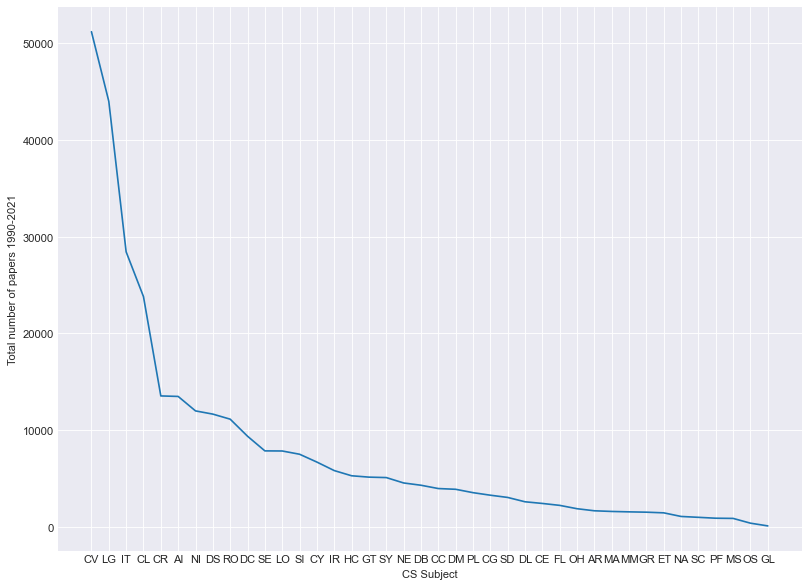

<Figure size 432x288 with 0 Axes>

In [23]:
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(12, 9), dpi=80)
x_plt = list(csub.keys())
y_plt = list(csub.values())
plt.plot(x_plt, y_plt)
plt.xlabel("CS Subject")
plt.ylabel("Total number of papers 1990-2021")
plt.show()
plt.savefig('../Graphs/Final/subjectDistributionFinal2.png')

In [24]:
subcategories = list(set(list(df_cs['sub_category'])))

In [25]:
df_cs_reduced = pd.DataFrame(columns=list(df_cs.columns))
for subcat in subcategories:
    if(len(df_cs[df_cs['sub_category'] == subcat].index)>=2000):
        df_cs_reduced = df_cs_reduced.append(df_cs[df_cs['sub_category'] == subcat].sample(2000))
    else:
        df_cs_reduced = df_cs_reduced.append(df_cs[df_cs['sub_category'] == subcat])

In [26]:
df_cs_reduced = df_cs_reduced.drop(columns='versions')

In [27]:
# Reduce the size of the data
df_random = df_random.sample(len(df_cs_reduced.index), random_state=42)

In [28]:
df_cs_reduced.to_csv("../Data/df_cs_reduced.csv", index=False)
df_random.to_csv("../Data/df_random_reduced.csv", index=False)

In [29]:
df_cs = df_cs_reduced

NLP Processing

In [30]:
#Define stopwords (scientific stopwords)
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
stopwords = STOP_WORDS

In [31]:
#Define the cleaner - remove punctuation
def cleanPunct(text):
    return [w for w in text if w not in punctuation]

In [32]:
# make everything lowercase
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
def low(instance):
    tokens = word_tokenize(instance)
    return [w.lower() for w in tokens if w not in ["(", ")"]]
# Removing stopwords and punctuation
def clean(text):
    return [w for w in text if w not in punctuation and w not in stopwords and w.isalpha() and len(w)>1]
def low2(instance):
    tokens = word_tokenize(instance)
    return [w.lower() for w in tokens if w not in punctuation and w not in stopwords and w.isalpha() and len(w)>1]

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/miamijovic/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [33]:
# Create column with lowercase text
df_cs['cleaned'] = df_cs.abstract.apply(low2)
df_random['cleaned'] = df_random.abstract.apply(low2)

In [34]:
# Make ngrams
from nltk.util import ngrams

def bigrams(arr):
    return list(ngrams(arr, 2))

def trigrams(arr):
    return list(ngrams(arr,3))

In [35]:
# Creating ngrams
df_cs['bigrams'] = df_cs.cleaned.apply(bigrams)
df_random['bigrams'] = df_random.cleaned.apply(bigrams)
df_cs['trigrams'] = df_cs.cleaned.apply(trigrams)
df_random['trigrams'] = df_random.cleaned.apply(trigrams)

In [36]:
def hyphenate(words, n):
    if(n==2):
        return [w[0]+'-'+w[1] for w in words]
    if(n==3):
        return [w[0]+'-'+w[1]+'-'+w[2] for w in words]

Language analysis

In [37]:
# Create dict func
def createDict(data):
    vocab = {}
    for instance in data:
        d = Counter(instance)
        for w in d.keys():
            if w in vocab:
                vocab[w] += d[w]
            else:
                vocab[w] = d[w]
    return dict(sorted(vocab.items(), key=lambda item: item[1], reverse=True))

In [38]:
from collections import Counter
uni_cs = createDict(df_cs['cleaned'])
bi_cs = createDict(df_cs['bigrams'])
tri_cs = createDict(df_cs['trigrams'])

uni_rand = createDict(df_random['cleaned'])
bi_rand = createDict(df_random['bigrams'])
tri_rand = createDict(df_random['trigrams'])

In [39]:
# Trim ngrams 
def trim(d, num):
    return dict((k, v) for k, v in d.items() if v>=num)

In [40]:
trim_value = 40
unigram_cs = trim(uni_cs, trim_value)
unigram_rand = trim(uni_rand, trim_value)
bigram_cs = trim(bi_cs, trim_value)
bigram_rand = trim(bi_rand, trim_value)
trigram_cs = trim(tri_cs, trim_value)
trigram_rand = trim(tri_rand, trim_value)

In [41]:
# Filter out dataframe, leave only ngrams from the list + hyphenate
def filterOutUniCs(words):
    return [w for w in words if w in unigram_cs]
def filterOutBiCs(words):
    return [w[0]+'-'+w[1] for w in words if w in bigram_cs]
def filterOutTriCs(words):
    return [w[0]+'-'+w[1]+'-'+w[2] for w in words if w in trigram_cs]
def filterOutUniRand(words):
    return [w for w in words if w in unigram_rand]
def filterOutBiRand(words):
    return [w[0]+'-'+w[1] for w in words if w in bigram_rand]
def filterOutTriRand(words):
    return [w[0]+'-'+w[1]+'-'+w[2] for w in words if w in trigram_rand]

In [42]:
df_cs.cleaned = df_cs.cleaned.apply(filterOutUniCs)
df_cs.bigrams = df_cs.bigrams.apply(filterOutBiCs)
df_cs.trigrams = df_cs.trigrams.apply(filterOutTriCs)

df_random.cleaned = df_random.cleaned.apply(filterOutUniRand)
df_random.bigrams = df_random.bigrams.apply(filterOutBiRand)
df_random.trigrams = df_random.trigrams.apply(filterOutTriRand)

Chi-Squared

In [43]:
#CHI-Square stastic where:
# a - number of times t and c co-occur 11
# b - number of times t occurs w/o c 10
# c - number of times c occurs w/o t 01
# d - number of times neither c nor t occur 00
def chi_square(n,a,b,c,d):
    return n*((a*d-c*b)**2)/((a+c)*(b+d)*(a+b)*(c+d))

In [44]:
def selectKbest(features, k):
    features = {a: v for a, v in sorted(features.items(), key=lambda item: item[1], reverse=True)}
    features = {a: features[a] for a in list(features)[:k]}
    return features

In [45]:
# a - number of times t and c co-occur 11 (term occurs in cs)
# b - number of times t occurs w/o c 10 (term occurs in random)
# c - number of times c occurs w/o t 01 (cs which dont contain term)
# d - number of times neither c nor t occur 00 (random which dont contain term)
def findChiValuesQuicker(cs_dict, random_dict, n):
    occurance_dict = {}
    chi_values = {}
    for instance in cs_dict['filteredAbstracts'].keys():
        terms = Counter(cs_dict['filteredAbstracts'][instance])
        for term in terms.keys():
            if(term in occurance_dict.keys()):
                if('a' in occurance_dict[term].keys()):
                    occurance_dict[term]['a'] += 1
                else:
                    occurance_dict[term]['a'] = 1
            else:
                occurance_dict[term] = {'a' : 1}
    for instance in random_dict['filteredAbstracts'].keys():
        terms = Counter(random_dict['filteredAbstracts'][instance])
        for term in terms.keys():
            if(term in occurance_dict.keys()):
                if('b' in occurance_dict[term].keys()):
                    occurance_dict[term]['b'] += 1
                else:
                    occurance_dict[term]['b'] = 1
            else:
                occurance_dict[term] = {'b' : 1}
    for term in occurance_dict.keys():
        if('a' in occurance_dict[term].keys()):
            occurance_dict[term]['c'] = int(n/2)-occurance_dict[term]['a']
        else:
            occurance_dict[term]['c'] = int(n/2)
            occurance_dict[term]['a'] = 0
        if('b' in occurance_dict[term].keys()):
            occurance_dict[term]['d'] = int(n/2)-occurance_dict[term]['b']
        else:
            occurance_dict[term]['d'] = int(n/2)
            occurance_dict[term]['b'] = 0
        chi_values[term] = chi_square(n, occurance_dict[term]['a'], occurance_dict[term]['b'], occurance_dict[term]['c'], occurance_dict[term]['d'])
    return chi_values

In [46]:
# Filter
def filterAbstract(tokens, chi_best_bi, chi_best_tri):
    # Find trigrams
    i = 0
    new1 = []
    while(i<len(tokens)-2):
        trigram = tokens[i]+'-'+tokens[i+1]+'-'+tokens[i+2]
        if(trigram in chi_best_tri):
            new1.append(trigram)
            i += 3
        else:
            new1.append(tokens[i])
            i += 1
    
    #Find bigrams
    i = 0
    new2 = []
    while(i<len(new1)-1):
        bigram = new1[i]+'-'+new1[i+1]
        if(bigram in chi_best_bi):
            new2.append(bigram)
            i += 2
        else:
            new2.append(new1[i])
            i += 1


    return new2

In [47]:
cs_dict = df_cs.to_dict()
random_dict = df_random.to_dict()

In [48]:
cs_dict['filteredAbstracts'] = {}
for instance in cs_dict['cleaned'].keys(): 
    cs_dict['filteredAbstracts'][instance] = filterAbstract(cs_dict['cleaned'][instance], cs_dict['bigrams'][instance], cs_dict['trigrams'][instance])

In [49]:
random_dict['filteredAbstracts'] = {}
for instance in random_dict['cleaned'].keys(): 
    random_dict['filteredAbstracts'][instance] = filterAbstract(random_dict['cleaned'][instance], random_dict['bigrams'][instance], random_dict['trigrams'][instance])

In [50]:
chi_values_quicker = findChiValuesQuicker(cs_dict, random_dict, len(df_cs.index)*2)

In [51]:
sorted_chi_values_quicker = {a: v for a, v in sorted(chi_values_quicker.items(), key=lambda item: item[1], reverse=True)}

In [52]:
sorted_chi_values_quicker

{'users': 3467.444196207956,
 'algorithms': 3106.9758555420917,
 'algorithm': 3031.5654691054024,
 'user': 2935.546660593083,
 'network': 2646.872157414114,
 'task': 2570.3053352517554,
 'mass': 2521.1279423260103,
 'performance': 2449.7785759413564,
 'tasks': 2445.3240074611826,
 'design': 2440.139128125932,
 'observed': 2305.553225968561,
 'learning': 2203.296897172094,
 'language': 2074.634754528908,
 'emission': 1931.2919618541923,
 'quantum': 1917.236291786283,
 'architecture': 1829.4808041290066,
 'spectra': 1792.9550869397037,
 'stars': 1792.452407120623,
 'in-paper-propose': 1772.2064053689928,
 'online': 1751.2768284270976,
 'communication': 1735.8860177323568,
 'information': 1716.1371992343563,
 'spin': 1704.28508220834,
 'dataset': 1658.8258327846088,
 'human': 1642.0748116787927,
 'networks': 1621.0457900324443,
 'particles': 1615.0153608041937,
 'software': 1604.8093814795366,
 'magnetic': 1594.638230052496,
 'research': 1578.7303279810399,
 'training': 1564.1047903392252

In [53]:
# Filter by chi value chiVal
def selectChiBest(features, chiVal):
    #features = {a: v for a, v in sorted(features.items(), key=lambda item: item[1], reverse=True)}
    features2 = {a: features[a] for a in features if features[a]>chiVal}
    return features2

In [54]:
chiVal = 90
chi_best = selectChiBest(sorted_chi_values_quicker, chiVal)
print(len(chi_best))

5214


In [55]:
df_cs.columns

Index(['id', 'category', 'abstract', 'list_categories', 'main_categories',
       'year', 'quarter', 'sub_category', 'cleaned', 'bigrams', 'trigrams'],
      dtype='object')

In [56]:
df_combined = df_cs[['abstract', 'list_categories', 'main_categories', 'year', 'quarter', 'sub_category']]

In [57]:
df_combined

,abstract,list_categories,main_categories,year,quarter,sub_category
1087128,We show new applications of the nearest-neig...,[cs.CG],[cs],2019,8076,CG
1245214,A 1-bend boundary labelling problem consists...,[cs.CG],[cs],2020,8080,CG
713664,"In this paper, an effective method with time...","[cs.CG, math.MG]","[cs, math]",2016,8065,CG
1228393,We present an algorithm for the following pr...,"[cs.CG, math.GN]","[cs, math]",2020,8080,CG
458533,It has long been known that cylindrical alge...,"[cs.CG, cs.SC]",[cs],2014,8059,CG
...,...,...,...,...,...,...
1493920,Activity-based learning helps students to le...,[cs.CY],[cs],2021,8086,CY
483815,"For a moment, imagine an active online learn...",[cs.CY],[cs],2013,8056,CY
581571,In open collaborative projects like Wikipedi...,[cs.CY],[cs],2014,8060,CY
1479700,Social media platforms bring together conten...,"[cs.CY, cs.LG, stat.ML]","[cs, stat]",2021,8086,CY


In [58]:
def filterAbstract(cs_dict, chi_best):
    completeDict = dict(chi_best)
    for key in cs_dict['filteredAbstracts'].keys():
        for term in cs_dict['filteredAbstracts'][key]:
            if term not in chi_best:
                cs_dict['filteredAbstracts'][key].remove(term)
                if(term in completeDict.keys()):
                    del completeDict[term]
    return cs_dict, completeDict

In [59]:
cs_dict_filtered, completeDict = filterAbstract(cs_dict, chi_best)

In [60]:
for val in cs_dict_filtered['filteredAbstracts'].values():    
    for key in val:
        if(key not in chi_best):
            print(key)

agglomerative
we-apply
euclidean
dimension
straight
model
geometric
set-cover
problem-consists
interior
bend
site
et-al
problems-solved
et-al
graph-in-paper
results
points
dimension
suitable
dimensions
given-number
helpful
exact
processes
possibly
polynomial-size
particular
loop
obtain
loop
known
decompositions
simplest
complicated
piano
producing
review
levels
formulations
allow
provide-new
analyse
problem-this
formulation
formulations
criteria
conclusions
euclidean
computed
arrangement
tangent
potential-function
report
model
potential-function
equivalent
model
set-system
by-contrast
problem-admits
our
quantitative
simulation-framework
maximum
distance
schedulers
particular
correlates
known
aka
leader-election
configurations
triples
order
order
iii
order
integer
coordinates
in
os
order
integer
in-article
order
integer
geometric
space
starting
defined
pattern
geometric
extension
general
pattern
pattern
partial
function-defined
simplex
values
resulting
partial
reduced
persistent-homolog

In [61]:
# How big is the corpus
corpus_len = 0
for key in cs_dict_filtered['filteredAbstracts']:
    for abstract in cs_dict_filtered['filteredAbstracts'][key]:
        corpus_len += len(abstract)
print(corpus_len)

27797326


In [62]:
# Join in a form for glove training
abstr = [" ".join(abstract) for abstract in list(cs_dict_filtered['filteredAbstracts'].values())]
abstracts = "\n".join(abstr)

In [63]:
import itertools
with open('../glove/new_abstracts.txt', 'w') as f:
    f.write(abstracts)

GloVe Embeddings

In [64]:
import numpy as np
vectors_path = '../glove/vectors.txt' # Change this to the relative path on your machine

def load_glove_model(File):
    glove_model = {}
    with open(File,'r') as f:
        for line in f:
            split_line = line.split()
            word = split_line[0]
            embedding = np.array(split_line[1:], dtype=np.float64)
            glove_model[word] = embedding
    print(f"{len(glove_model)} words loaded!")
    return glove_model

vectors = load_glove_model(vectors_path)
print(vectors['paper'])

3816 words loaded!
[-4.55869e-01 -8.33530e-02  1.29114e-01 -5.74870e-02 -1.05309e-01
  1.32345e-01 -4.66981e-01  5.33786e-01  3.24302e-01  8.76160e-02
  2.93685e-01 -3.26061e-01  7.23513e-01 -1.50223e-01 -2.78074e-01
  4.70577e-01  6.43952e-01  5.31253e-01  4.45866e-01  2.40871e-01
 -4.11550e-01  4.45000e-04  5.05008e-01  7.14560e-01 -3.16821e-01
  1.70400e-03 -6.33837e-01 -9.34800e-03 -5.99528e-01 -7.98739e-01
  1.79493e-01 -2.45461e-01  9.18520e-02  6.76664e-01  3.82785e-01
  4.09859e-01  2.03831e-01  6.63369e-01 -7.23802e-01 -6.58551e-01
 -5.19683e-01  4.24412e-01 -8.01134e-01 -6.88995e-01  1.77876e-01
  2.76943e-01  7.58040e-02 -5.88360e-02  1.01228e-01  3.19571e-01]


In [65]:
def createVectors(all_terms, vectors):
    termDict = {}
    for term in all_terms:
        try:
            termDict[term] = vectors[term]
        except:
            print(term)
    return termDict

In [66]:
def vec2term(vector, vectors):
    for vec in vectors:
        if vec.value().all == vector:
            return vec.key()
    return "NO MATCH"

In [67]:
termDict = createVectors(completeDict, vectors)

galaxies
galaxy
stellar
electrons
relativistic
plasma
spectroscopy
ground-state
cosmological
telescope
luminosity
gravitational
black-hole
photon
galactic
photons
dark-matter
vacuum
chiral
orbital
qcd
gev
redshift
dust
lhc
resonances
bright
magnetization
quark
graphene
excitations
neutrino
jet
star-formation
spectroscopic
fermions
ions
transverse
astrophysical
dirac
ferromagnetic
mev
black-holes
accretion
su
magnetic-fields
charged
cosmic
amplitudes
nuclei
ion
jets
superconductivity
photometry
neutrinos
metallic
suppressed
proton
halo
we-calculate
tev
phase-diagram
wavelengths
electric-field
cosmology
scalar-field
angular-momentum
supersymmetric
excited
exotic
perturbative
neutron
spins
planets
kpc
shock
cohomology
quarks
metallicity
hydrogen
fermion
hadronic
planet
phenomenological
ionization
higgs
observatory
antiferromagnetic
cross-section
agn
fermi
fluxes
general-relativity
condensate
superconductors
kev
density-functional-theory
hydrodynamic
doping
abundances
radiative
dark-energy

In [68]:
with open('../Data/termDict2.json', 'w') as outfile:
    json.dump(str(termDict), outfile)   

Clustering

In [69]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from scipy.spatial.distance import cdist
from sklearn import metrics

In [70]:
k = 300
kmeans = KMeans(n_clusters=k, random_state=42)
np_vectors= list(termDict.values())

In [71]:
import math
for i in range(len(np_vectors)):
    if(np.isnan(np.sum(np_vectors[i]))):
        np_vectors[i] = [0]*50

In [72]:
#PCA reduction
from sklearn.decomposition import PCA
pca = PCA(n_components=20)

pca.fit(np_vectors)

PCA(n_components=20)

In [73]:
def kMeansPredict(np_vector):
    return kmeans.fit_predict(np_vector)

y_pred= kMeansPredict(np_vectors)

In [74]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=0, perplexity=50, n_iter=1000, random_state=0)
tsne_results = tsne.fit_transform(np_vectors)

/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


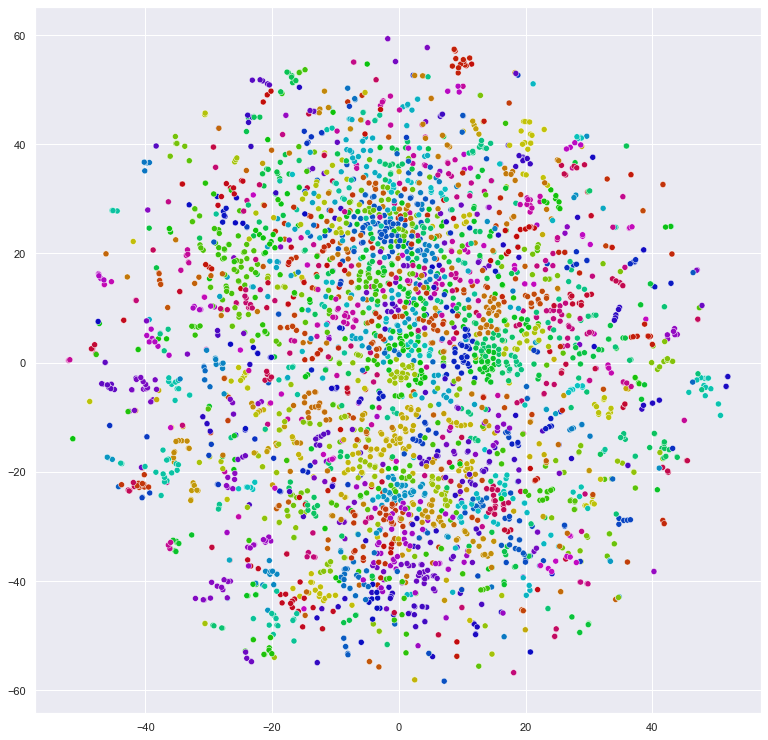

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(rc={'figure.figsize':(13,13)})

palette = sns.hls_palette(k, l=.4, s=.9)

sns.scatterplot(tsne_results[:,0], tsne_results[:,1], hue=y_pred, palette=palette, legend=False)
plt.savefig('../Graphs/scatterPlotTopics.png')

In [76]:
zip_iterator = zip(termDict.keys(), y_pred)

value_clusters = dict(zip_iterator)

In [77]:
clusters = {}
for term in value_clusters.items():
    clusters[term[1]] = []
for term in value_clusters.items():
    clusters[term[1]].append(term[0])

In [78]:
for i in clusters.keys():
    print(i,clusters[i])

167 ['users', 'user']
63 ['algorithms', 'algorithm', 'quantum', 'we-study', 'variants', 'variant', 'classic', 'generalized', 'classical', 'approximate', 'approximation', 'we-consider', 'versions']
18 ['network', 'networks', 'nodes', 'node', 'neighbors', 'links', 'connectivity', 'nodes-network', 'number-nodes', 'nodes-we']
214 ['task', 'tasks', 'calculations', 'perform', 'executed', 'execute', 'performs', 'evaluations', 'plan', 'executing', 'expert', 'performing', 'join', 'subjects']
257 ['mass', 'magnetic', 'electron', 'decay', 'gravity', 'resonance', 'temperatures', 'anisotropy', 'beam', 'laser', 'localized', 'ev', 'earth', 'beams', 'strain', 'force', 'electrostatic', 'crowd', 'forces', 'cone', 'soft']
222 ['performance', 'improve', 'better', 'achieve', 'achieves', 'improving', 'achieving', 'improves', 'accuracy', 'efficiency', 'improvement', 'improvements', 'gains', 'achieved', 'overall', 'speed', 'improved', 'compared', 'loss']
57 ['design', 'software', 'implementation', 'implemente

In [79]:
df_combined['filteredAbstracts'] = cs_dict_filtered['filteredAbstracts'].values()

/var/folders/9k/9qw6yrzx6493tcr085_zrwj40000gn/T/ipykernel_55113/203523290.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined['filteredAbstracts'] = cs_dict_filtered['filteredAbstracts'].values()


In [80]:
df_combined.to_csv('../Data/df_combined_new')

Number of hits per topic

In [81]:
def topicHits(text, value_clusters):
    topics = {}
    wordDict = Counter(text)
    for word in wordDict.keys():
        if(word in value_clusters.keys()):
            topics[value_clusters[word]] = wordDict[word]
    return topics

In [82]:
#Just return which topics were hit
def pureTopics(topics):
    return topics.keys()

In [83]:
df_combined['topic_hits'] = df_combined.filteredAbstracts.apply(topicHits, value_clusters=value_clusters)
df_combined['topics'] = df_combined.topic_hits.apply(pureTopics)
df_combined

/var/folders/9k/9qw6yrzx6493tcr085_zrwj40000gn/T/ipykernel_55113/1965767475.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined['topic_hits'] = df_combined.filteredAbstracts.apply(topicHits, value_clusters=value_clusters)
/var/folders/9k/9qw6yrzx6493tcr085_zrwj40000gn/T/ipykernel_55113/1965767475.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined['topics'] = df_combined.topic_hits.apply(pureTopics)


,abstract,list_categories,main_categories,year,quarter,sub_category,filteredAbstracts,topic_hits,topics
1087128,We show new applications of the nearest-neig...,[cs.CG],[cs],2019,8076,CG,"[applications, algorithm, technique, agglomera...","{40: 1, 63: 1, 33: 1, 173: 1, 267: 1, 89: 1, 2...","(40, 63, 33, 173, 267, 89, 271, 239, 78, 196, ..."
1245214,A 1-bend boundary labelling problem consists...,[cs.CG],[cs],2020,8080,CG,"[boundary, problem-consists, rectangle, called...","{283: 6, 84: 1, 205: 3, 133: 1, 24: 1, 221: 1,...","(283, 84, 205, 133, 24, 221, 153, 27, 267, 183..."
713664,"In this paper, an effective method with time...","[cs.CG, math.MG]","[cs, math]",2016,8065,CG,"[in-paper, time-complexity, find, approximatio...","{239: 1, 271: 2, 225: 1, 63: 2, 33: 2, 149: 1,...","(239, 271, 225, 63, 33, 149, 89, 24, 40)"
1228393,We present an algorithm for the following pr...,"[cs.CG, math.GN]","[cs, math]",2020,8080,CG,"[we-present-algorithm, given, possibly, closed...","{271: 1, 196: 1, 194: 2, 283: 1, 24: 1, 72: 1,...","(271, 196, 194, 283, 24, 72, 237, 0, 103, 267,..."
458533,It has long been known that cylindrical alge...,"[cs.CG, cs.SC]",[cs],2014,8059,CG,"[it, known, decompositions, theory, robot, mot...","{205: 1, 46: 2, 192: 1, 157: 1, 41: 1, 63: 1, ...","(205, 46, 192, 157, 41, 63, 267, 119, 28, 266,..."
...,...,...,...,...,...,...,...,...,...
1493920,Activity-based learning helps students to le...,[cs.CY],[cs],2021,8086,CY,"[learning, helps, students, learn, participati...","{286: 1, 44: 1, 36: 3, 228: 1, 278: 1, 69: 1, ...","(286, 44, 36, 228, 278, 69, 160, 10, 267, 32, ..."
483815,"For a moment, imagine an active online learn...",[cs.CY],[cs],2013,8056,CY,"[moment, online-learning, community, artists, ...","{282: 1, 99: 1, 58: 1, 27: 1, 37: 1, 263: 1, 4...","(282, 99, 58, 27, 37, 263, 44, 42, 268, 131, 2..."
581571,In open collaborative projects like Wikipedi...,[cs.CY],[cs],2014,8060,CY,"[open, collaborative, projects, like, wikipedi...","{13: 1, 37: 1, 160: 1, 99: 2, 10: 1, 20: 1, 16...","(13, 37, 160, 99, 10, 20, 162, 119, 170, 26, 2..."
1479700,Social media platforms bring together conten...,"[cs.CY, cs.LG, stat.ML]","[cs, stat]",2021,8086,CY,"[social-media-platforms, bring, content, conte...","{131: 1, 58: 2, 243: 9, 50: 1, 142: 1, 160: 1,...","(131, 58, 243, 50, 142, 160, 107, 76, 10, 99, ..."


Forming data further

In [84]:
# Topic hits per year
hits_per_year = {}
for index, row in df_combined.iterrows():
    if(row['year'] in hits_per_year.keys()):
        hits_per_year[row['year']] = Counter(hits_per_year[row['year']]) + Counter(row['topics'])
    else:
        hits_per_year[row['year']] = Counter(row['topics'])
for key in hits_per_year.keys():
    hits_per_year[key] = {k: v for k, v in sorted(dict(hits_per_year[key]).items(), key=lambda item: item[1], reverse=True)}

#hits_per_year

In [85]:
df_combined

,abstract,list_categories,main_categories,year,quarter,sub_category,filteredAbstracts,topic_hits,topics
1087128,We show new applications of the nearest-neig...,[cs.CG],[cs],2019,8076,CG,"[applications, algorithm, technique, agglomera...","{40: 1, 63: 1, 33: 1, 173: 1, 267: 1, 89: 1, 2...","(40, 63, 33, 173, 267, 89, 271, 239, 78, 196, ..."
1245214,A 1-bend boundary labelling problem consists...,[cs.CG],[cs],2020,8080,CG,"[boundary, problem-consists, rectangle, called...","{283: 6, 84: 1, 205: 3, 133: 1, 24: 1, 221: 1,...","(283, 84, 205, 133, 24, 221, 153, 27, 267, 183..."
713664,"In this paper, an effective method with time...","[cs.CG, math.MG]","[cs, math]",2016,8065,CG,"[in-paper, time-complexity, find, approximatio...","{239: 1, 271: 2, 225: 1, 63: 2, 33: 2, 149: 1,...","(239, 271, 225, 63, 33, 149, 89, 24, 40)"
1228393,We present an algorithm for the following pr...,"[cs.CG, math.GN]","[cs, math]",2020,8080,CG,"[we-present-algorithm, given, possibly, closed...","{271: 1, 196: 1, 194: 2, 283: 1, 24: 1, 72: 1,...","(271, 196, 194, 283, 24, 72, 237, 0, 103, 267,..."
458533,It has long been known that cylindrical alge...,"[cs.CG, cs.SC]",[cs],2014,8059,CG,"[it, known, decompositions, theory, robot, mot...","{205: 1, 46: 2, 192: 1, 157: 1, 41: 1, 63: 1, ...","(205, 46, 192, 157, 41, 63, 267, 119, 28, 266,..."
...,...,...,...,...,...,...,...,...,...
1493920,Activity-based learning helps students to le...,[cs.CY],[cs],2021,8086,CY,"[learning, helps, students, learn, participati...","{286: 1, 44: 1, 36: 3, 228: 1, 278: 1, 69: 1, ...","(286, 44, 36, 228, 278, 69, 160, 10, 267, 32, ..."
483815,"For a moment, imagine an active online learn...",[cs.CY],[cs],2013,8056,CY,"[moment, online-learning, community, artists, ...","{282: 1, 99: 1, 58: 1, 27: 1, 37: 1, 263: 1, 4...","(282, 99, 58, 27, 37, 263, 44, 42, 268, 131, 2..."
581571,In open collaborative projects like Wikipedi...,[cs.CY],[cs],2014,8060,CY,"[open, collaborative, projects, like, wikipedi...","{13: 1, 37: 1, 160: 1, 99: 2, 10: 1, 20: 1, 16...","(13, 37, 160, 99, 10, 20, 162, 119, 170, 26, 2..."
1479700,Social media platforms bring together conten...,"[cs.CY, cs.LG, stat.ML]","[cs, stat]",2021,8086,CY,"[social-media-platforms, bring, content, conte...","{131: 1, 58: 2, 243: 9, 50: 1, 142: 1, 160: 1,...","(131, 58, 243, 50, 142, 160, 107, 76, 10, 99, ..."


In [86]:
hits_per_quarter = {}
for index, row in df_combined.iterrows():
    if(row['quarter'] in hits_per_quarter.keys()):
        hits_per_quarter[row['quarter']] = Counter(hits_per_quarter[row['quarter']]) + Counter(row['topics'])
    else:
        hits_per_quarter[row['quarter']] = Counter(row['topics'])
for key in hits_per_quarter.keys():
    hits_per_quarter[key] = {k: v for k, v in sorted(dict(hits_per_quarter[key]).items(), key=lambda item: item[1], reverse=True)}

#hits_per_quarter

In [87]:
hits_per_quarter

{8076: {239: 1219,
  205: 1101,
  10: 1041,
  160: 914,
  34: 905,
  277: 743,
  222: 720,
  57: 705,
  33: 667,
  170: 574,
  179: 556,
  149: 540,
  46: 521,
  41: 516,
  63: 506,
  216: 505,
  196: 492,
  299: 446,
  173: 427,
  44: 424,
  40: 419,
  237: 419,
  225: 395,
  58: 379,
  267: 358,
  61: 337,
  121: 330,
  18: 330,
  115: 323,
  214: 316,
  212: 310,
  86: 291,
  85: 290,
  83: 286,
  13: 275,
  265: 269,
  7: 265,
  286: 262,
  74: 246,
  23: 246,
  291: 243,
  240: 238,
  183: 228,
  87: 224,
  144: 215,
  104: 210,
  42: 203,
  24: 198,
  235: 193,
  65: 193,
  99: 193,
  202: 193,
  279: 190,
  151: 187,
  236: 186,
  175: 175,
  96: 173,
  107: 173,
  228: 171,
  136: 169,
  76: 167,
  69: 167,
  167: 167,
  126: 164,
  26: 162,
  162: 162,
  80: 162,
  114: 160,
  122: 157,
  95: 155,
  71: 150,
  147: 149,
  129: 148,
  14: 148,
  176: 148,
  21: 146,
  43: 146,
  210: 145,
  226: 144,
  262: 143,
  220: 140,
  169: 138,
  139: 136,
  103: 130,
  60: 129,
  256: 

In [1066]:
#Plotting
# 2021: {26: 2100}
# x axis: 2021, y axis: 2100, line: 26
def plottingParams(hits_per_year):
    k = 300
    min_yr = int(min(set(hits_per_year.keys())))
    max_yr = int(max(set(hits_per_year.keys())))
    yrs = max_yr-min_yr+1
    list_years = list(hits_per_year.keys())
    list_years.reverse()
    x_plotting = np.array(list(range(min_yr, max_yr+1)))
    y_plotting = np.zeros((k,yrs))
    for year in hits_per_year.keys():
        for line in hits_per_year[year].keys():
            y_plotting[line][int(year)-min_yr] = hits_per_year[year][line]
    return x_plotting, y_plotting

In [1067]:
x_plotting, y_plotting = plottingParams(hits_per_year)
x_plotting_quarter, y_plotting_quarter = plottingParams(hits_per_quarter)

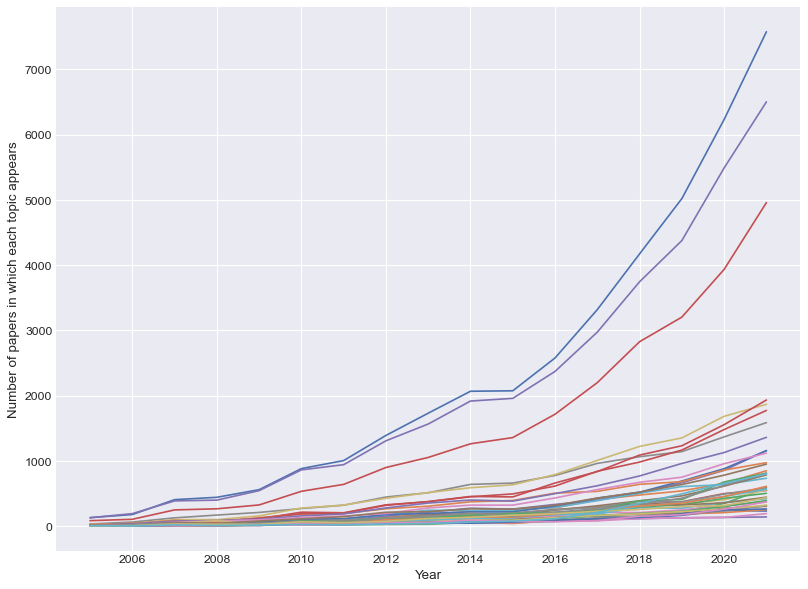

In [1068]:
plt.style.use('seaborn-darkgrid')
k = len(set(y_pred))
plt.figure(figsize=(12, 9), dpi=80)
for i in range(k):
    plt.plot(x_plotting, y_plotting[i], label=i)
#plt.legend()
plt.xlabel("Year")
plt.ylabel("Number of papers in which each topic appears")
plt.savefig("../Graphs/topicHits.png")

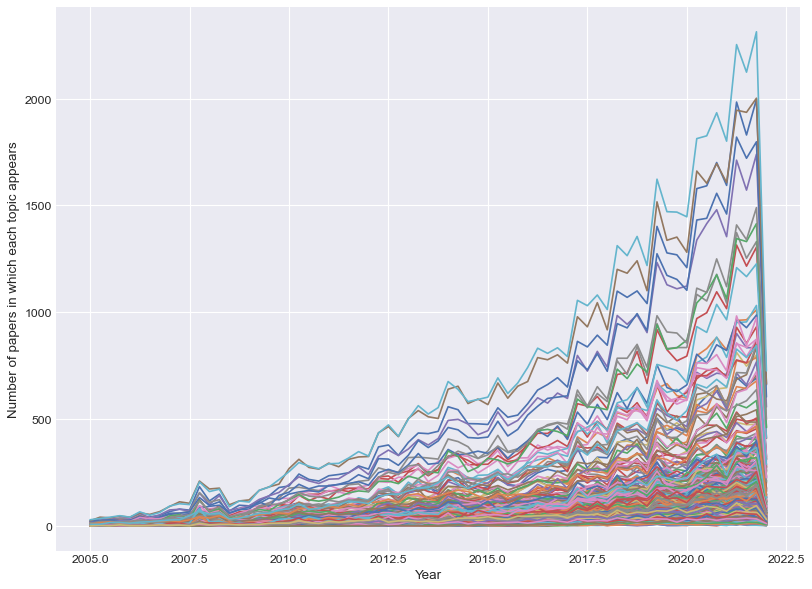

In [1069]:
k = len(set(y_pred))
plt.figure(figsize=(12, 9), dpi=80)
for i in range(len(y_plotting_quarter)):
    plt.plot(np.divide(x_plotting_quarter, 4), y_plotting_quarter[i], label=i)
#plt.legend()
plt.xlabel("Year")
plt.ylabel("Number of papers in which each topic appears")
plt.savefig("../Graphs/topicHitsQuarter.png")

In [1070]:
# Find how many abstracts there are per year
abstracts_per_year = {}
for index, row in df_combined.iterrows():
    if(row['year'] in abstracts_per_year.keys()):
        abstracts_per_year[row['year']] += 1
    else:
        abstracts_per_year[row['year']] = 1

# Find how many abstracts there are per quarter
abstracts_per_quarter = {}
for index, row in df_combined.iterrows():
    if(row['quarter'] in abstracts_per_quarter.keys()):
        abstracts_per_quarter[row['quarter']] += 1
    else:
        abstracts_per_quarter[row['quarter']] = 1

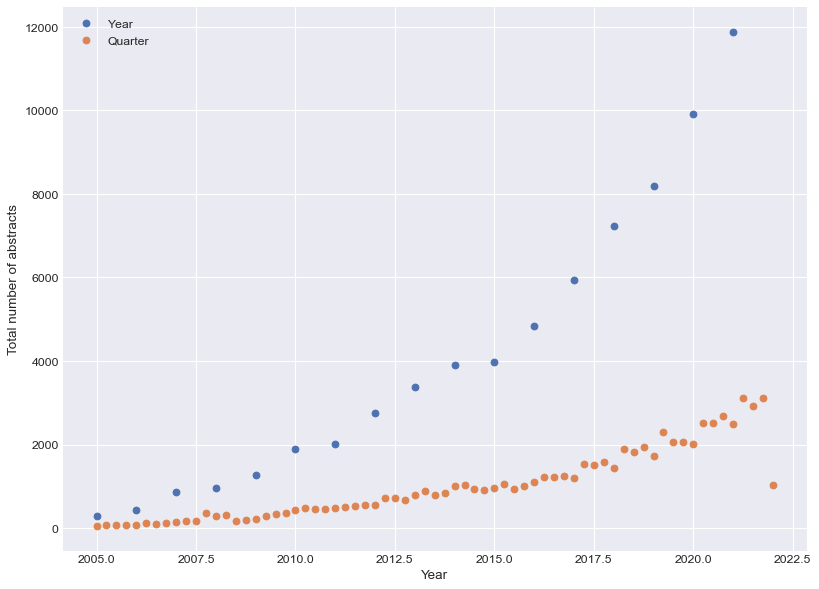

In [1071]:
plt.figure(figsize=(12, 9), dpi=80)
plt.scatter(list(abstracts_per_year.keys()), list(abstracts_per_year.values()), label='Year')
x_abstracts_per_quarter = np.array([int(q) for q in abstracts_per_quarter.keys()])
x_abstracts_per_quarter = np.divide(x_abstracts_per_quarter, 4)
plt.scatter(x_abstracts_per_quarter, list(abstracts_per_quarter.values()), label='Quarter')
plt.xlabel('Year')
plt.ylabel('Total number of abstracts')
plt.legend()
plt.savefig('../Graphs/Final/abstractsPerYear')

In [1053]:
#Normalization
hits_normalized_year = {}
for year in hits_per_year.keys():
    total = abstracts_per_year[year]
    hits_normalized_year[int(year)] = {}
    for key in hits_per_year[year].keys():
        hits_normalized_year[int(year)][key] = hits_per_year[year][key]/total

hits_normalized_quarter = {}
for quarter in hits_per_quarter.keys():
    total = abstracts_per_quarter[quarter]
    hits_normalized_quarter[int(quarter)] = {}
    for key in hits_per_quarter[quarter].keys():
        hits_normalized_quarter[int(quarter)][key] = hits_per_quarter[quarter][key]/total

hits_normalized = hits_normalized_year

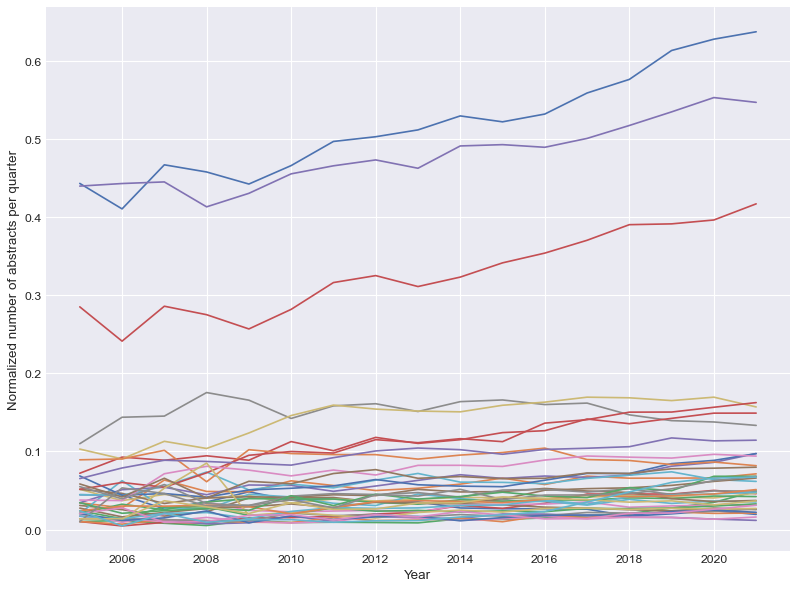

In [1073]:
x_p, y_p = plottingParams(hits_normalized)
plt.figure(figsize=(12, 9), dpi=80)
for i in range(k):
    plt.plot(x_p, y_p[i], label=i)
plt.ylabel('Normalized number of abstracts per quarter')
plt.xlabel('Year')
plt.savefig('../Graphs/Final/hitsPerYear.png')

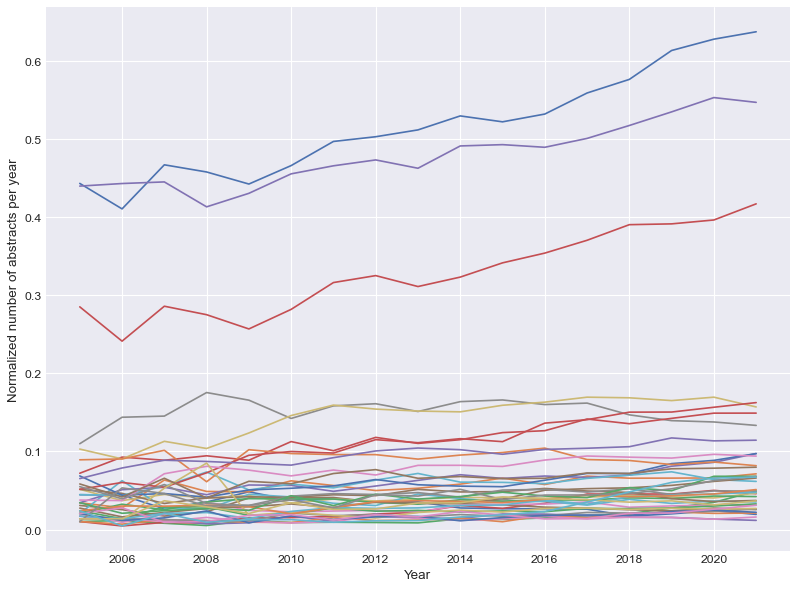

In [1074]:
x_p_year, y_p_year = plottingParams(hits_normalized_year)
plt.figure(figsize=(12, 9), dpi=80)
for i in range(k):
    plt.plot(x_p_year, y_p_year[i], label=i)
plt.ylabel('Normalized number of abstracts per year')
plt.xlabel('Year')
plt.savefig('../Graphs/Final/hitsPerYearYear.png')

Cut off data before 2005 and which appear fewer than 8 times per year

In [97]:
def cutOff(hits_per_year, y):
    hits_new = {}
    for year in hits_per_year.keys():
        if(y):
            if(year >= 2005):
                hits_new[year] = {}
                for topic in hits_per_year[year]:
                    if hits_per_year[year][topic] > 8:
                        hits_new[year][topic] = hits_per_year[year][topic]
        else:
            if(year >= 8020):
                hits_new[year] = {}
                for topic in hits_per_year[year]:
                    if hits_per_year[year][topic] > 2:
                        hits_new[year][topic] = hits_per_year[year][topic]

    return hits_new

In [98]:
def findTotalTopicsPerYear(hits_per_year):
    topics_per_year = {}
    for year in hits_per_year.keys():
        topics_per_year[year] = sum(hits_per_year[year].values())
    return topics_per_year

In [99]:
def normalize(hits_per_year, abstracts_per_year):
    hits_normalized = {}
    for year in hits_per_year.keys():
        total = abstracts_per_year[year]
        hits_normalized[int(year)] = {}
        for key in hits_per_year[year].keys():
            hits_normalized[int(year)][key] = hits_per_year[year][key]/total
    return hits_normalized

In [100]:
#hits_per_quarter2 = cutOff(hits_per_quarter, False)
#hits_normalized = normalize(hits_per_quarter2, abstracts_per_quarter)

In [101]:
#hits_per_quarter2

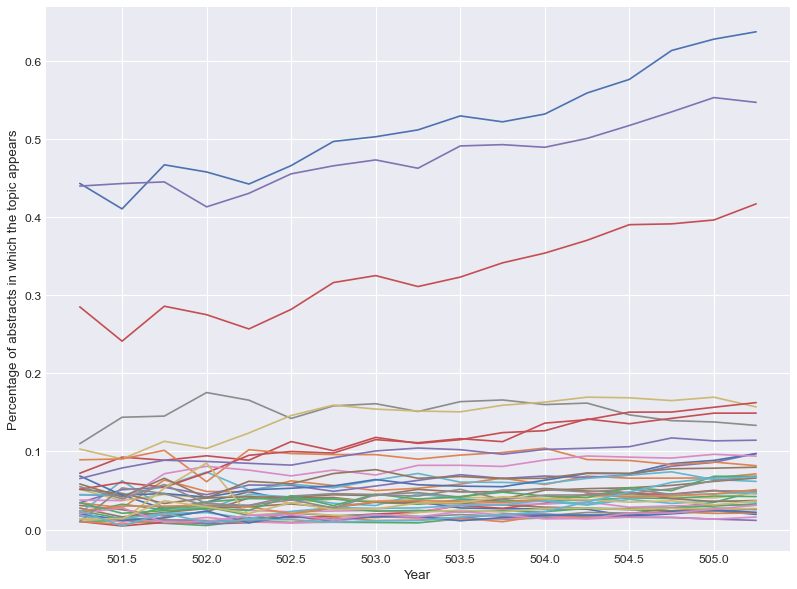

In [1075]:
plt.style.use('seaborn-darkgrid')
x_p, y_p = plottingParams(hits_normalized)
plt.figure(figsize=(12, 9), dpi=80)
for i in range(k):
    plt.plot(np.divide(x_p, 4), y_p[i], label=i)
plt.ylabel('Percentage of abstracts in which the topic appears')
plt.xlabel('Year')
plt.savefig('../Graphs/Final/hitsNormalizedCut.png')
#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

Modelling subjects

In [103]:
#Making time sequence for subjects
def makeTimeSeq(year_per_subject):
    time_seq = {}
    year_min = int(list(subject_per_year.keys())[-1])
    year_max = int(list(subject_per_year.keys())[0])
    for subj in year_per_subject.keys():
        arr = np.zeros(year_max-year_min+1)
        for year in year_per_subject[subj].keys():
            arr[year-year_min] = year_per_subject[subj][year]
        time_seq[subj] = arr
    return time_seq

In [104]:
df_combined = df_combined.rename(columns={'sub_category':'subfield'})

In [105]:
# Topic hits per year
# In this and that year I have this many IT, this many LG ...
def yearHits():
    hits_per_year = {}
    for index, row in df_combined.iterrows():
        if(row['year'] in hits_per_year.keys()):
            if(row['subfield'] in hits_per_year[row['year']].keys()):
                hits_per_year[row['year']][row['subfield']] += 1
            else:
                hits_per_year[row['year']][row['subfield']] = 1
        else:
            hits_per_year[row['year']] = {row['subfield'] : 1}
    for key in hits_per_year.keys():
        hits_per_year[key] = {k: v for k, v in sorted(dict(hits_per_year[key]).items(), key=lambda item: item[1], reverse=True)}

    hits_normalized = {}
    for year in hits_per_year.keys():
        total = 0
        hits_normalized[int(year)] = {}
        for key in hits_per_year[year].keys():
            total += hits_per_year[year][key]
        for key in hits_per_year[year].keys():
            hits_normalized[int(year)][key] = hits_per_year[year][key]/total
    
    hits_per_year = {k: v for k, v in sorted(dict(hits_per_year).items(), key=lambda item: item[0], reverse=True)}
    hits_normalized = {k: v for k, v in sorted(dict(hits_normalized).items(), key=lambda item: item[0], reverse=True)}

    return hits_per_year, hits_normalized

In [106]:
subject_per_year, subject_per_year_norm = yearHits()

In [107]:
# Convert dictionary
def year_to_subject(subject_per_year):
    year_per_subject = {}
    for year in subject_per_year.keys():
        d = subject_per_year[year]
        for subj in d.keys():
            if(subj in year_per_subject.keys()):
                year_per_subject[subj][year] = d[subj]
            else:
                year_per_subject[subj] = {year : d[subj]}
    return year_per_subject

In [108]:
year_per_subject_norm = year_to_subject(subject_per_year_norm)
time_seq = makeTimeSeq(year_per_subject_norm)

In [109]:
# Shorten time_seq to post 2005
def shortenTimeSeq(time_seq, y_p):
    ts2 = {}
    startingIndex = len(time_seq['AI'])-len(y_p[0])
    for subj in time_seq.keys():
        ts2[subj] = time_seq[subj][startingIndex:]
    return ts2

In [110]:
time_seq = shortenTimeSeq(time_seq, y_p)

In [111]:
def findSubjectTopicHits(topic, f):
    hits_per_field = {}
    for index, row in df_combined.iterrows():
        if(row[f] in hits_per_field.keys()):
            hits_per_field[row[f]] = Counter(hits_per_field[row[f]]) + Counter(row[topic])
        else:
            hits_per_field[row[f]] = Counter(row[topic])
    for key in hits_per_field.keys():
        hits_per_field[key] = {k: v for k, v in sorted(dict(hits_per_field[key]).items(), key=lambda item: item[1], reverse=True)}

    hits_normalized_field = {}
    for field in hits_per_field.keys():
        total = 0
        hits_normalized_field[field] = {}
        for key in hits_per_field[field].keys():
            total += hits_per_field[field][key]
        for key in hits_per_field[field].keys():
            hits_normalized_field[field][key] = hits_per_field[field][key]/total

    return hits_per_field, hits_normalized_field


In [112]:
subject_no, subject_topic_hits = findSubjectTopicHits('topic_hits', 'subfield')
topics_no, subject_topics = findSubjectTopicHits('topics', 'subfield')

Determining how good the topics are

In [113]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
# Multinomial Naive Bayes Classifier
def NBClassifier(X,y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    mnb = MultinomialNB()
    mnb.fit(X_train, y_train)
    y_pred = mnb.predict(X_test)
    y_pred_classes = mnb.predict_proba(X_test)
    classes = mnb.classes_
    return y_pred, y_pred_classes, y_test, classes

In [114]:
#Mean Reciprocal Rank
def MRR(y_pred_classes, y_test, classes):
    s = 0
    for i in range(len(y_pred_classes)):
        classNum = list(classes).index(y_test[i])
        val = y_pred_classes[i][classNum]
        sorted_list = sorted(y_pred_classes[i], reverse=True)
        index = sorted_list.index(val)
        s += 1/(index+1)
    mrr = 1/len(y_pred_classes) * s
    return mrr

In [115]:
def formDatafromDF(df_combined):
    X = np.zeros((len(df_combined['subfield']),k))
    i = 0
    y = ['']*len(df_combined['subfield'])
    for index, row in df_combined.iterrows():
        y[i] = str(row['subfield'])
        for key in row['topic_hits'].keys():
            X[i][key] = row['topic_hits'][key]
        i+=1
    return X, y

In [116]:
def formDatafromDF2(df_combined):
    X = np.zeros((len(df_combined['subfield']),k))
    i = 0
    y = ['']*len(df_combined['subfield'])
    for index, row in df_combined.iterrows():
        y[i] = str(row['subfield'])
        for topic in row['topics']:
            X[i][topic] = 1
        i+=1
    return X, y

In [117]:
X_df, y_df = formDatafromDF(df_combined)

In [118]:
X_df2, y_df2 = formDatafromDF2(df_combined)

In [119]:
y_pred, y_pred_classes, y_test, classes = NBClassifier(X_df, y_df)

In [120]:
y_pred2, y_pred_classes2, y_test2, classes2 = NBClassifier(X_df2, y_df2)

In [121]:
mrr = MRR(y_pred_classes, y_test, classes)
mrr2 = MRR(y_pred_classes2, y_test2, classes2)
print(mrr, mrr2)

0.6222708357350348 0.622700613369949


In [122]:
#Randomised allocation performance
from random import randint
s = 0
for i in range(len(y_pred_classes)):
    classNum = randint(0,39)
    val = y_pred_classes[i][classNum]
    sorted_list = sorted(y_pred_classes[i], reverse=True)
    index = sorted_list.index(val)
    s += 1/(index+1)
mrrRandom = 1/len(y_pred_classes) * s
print(mrrRandom)

0.10820657670620554


Tf-Idf

In [123]:
def tf_idf(subject_no):
    #Inverts keys e.g. {IT: {162: 123}} to {162: {IT: 123}}    
    subject_per_topic = year_to_subject(subject_no)
    #df
    df = {}
    for topic in subject_per_topic.keys():
        df[topic] = len(subject_per_topic[topic].keys())
    #idf
    idf = {}
    for topic in df.keys():
        idf[topic] = np.log10(len(subject_no.keys())/(df[topic]+1))

    # print("idf: ", idf)
    
    #tf
    tfIdf = {}
    for subj in subject_no.keys():
        tfIdf[subj] = {}
        for topic in subject_no[subj].keys():
            t_in_d = subject_no[subj][topic]
            all_in_d = len(subject_no[subj].keys())
            tf = t_in_d/all_in_d
            #print("tf: ", tf)
            tfIdf[subj][topic] = tf*idf[topic]
    
    for key in tfIdf.keys():
        tfIdf[key] = {k: v for k, v in sorted(dict(tfIdf[key]).items(), key=lambda item: item[1], reverse=True)}

    return tfIdf


In [124]:
tfIdf = tf_idf(topics_no)

In [125]:
def cutOffSubjectTopics(subject_topic_hits):
    sth = {}
    for subj in subject_topic_hits.keys():
        sth[subj] = {}
        total = 0
        for topic in subject_topic_hits[subj].keys():
            if(subject_topic_hits[subj][topic]>=0.01):
                sth[subj][topic] = subject_topic_hits[subj][topic]
                total += subject_topic_hits[subj][topic]
        for topic in sth[subj]:
            sth[subj][topic] = sth[subj][topic]/total
        
    return sth

In [126]:
sth = cutOffSubjectTopics(subject_topics)

In [127]:
def formCutOffSubjectNo(subject_no, sth):
    subject_no2 = {}
    for subj in subject_no.keys():
        subject_no2[subj] = {}
        for topic in subject_no[subj].keys():
            if(topic in sth[subj].keys()):
                subject_no2[subj][topic] = subject_no[subj][topic]
    return subject_no2

In [128]:
topics_no2 = formCutOffSubjectNo(topics_no, sth)

In [129]:
tfIdf = tf_idf(topics_no2)

In [130]:
def findTopTfIdf(tfIdf, threshold):
    topTfIdf = {}
    for subj in tfIdf.keys():
        topTfIdf[subj] = dict(list(tfIdf[subj].items())[:threshold])
    return topTfIdf

In [131]:
topTfIdf = findTopTfIdf(tfIdf, 10)

Investigating Autocorrelation and stuff

In [132]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

In [133]:
from statsmodels.tsa.stattools import adfuller
def calcAdFuller(seq):
    result = adfuller(seq)
    print('0th ADF Statistic: %f' % result[0], 'p-value: %f' % result[1])
    first_diff = np.diff(seq)
    second_diff = np.diff(seq, n=2)
    afv1 = adfuller(first_diff)
    afv2 = adfuller(second_diff)
    stat = first_diff
    print(len(stat))
    print('1st ADF Statistic: %f' % afv1[0], 'p-value: %f' % afv1[1])
    print('2nd ADF Statistic: %f' % afv2[0], 'p-value: %f' % afv2[1])
    #return result[1], afv1[1], afv2[1]
    return stat

In [134]:
time_seq_diff = {}
for key in time_seq.keys():
    print(key)
    time_seq_diff[key] = calcAdFuller(time_seq[key])

SD
0th ADF Statistic: 7.930181 p-value: 1.000000
16
1st ADF Statistic: 5.453228 p-value: 1.000000
2nd ADF Statistic: -3.636017 p-value: 0.005109
LG
0th ADF Statistic: 2.503628 p-value: 0.999051
16
1st ADF Statistic: -2.212434 p-value: 0.201764
2nd ADF Statistic: -5.619692 p-value: 0.000001
CL
0th ADF Statistic: 5.940577 p-value: 1.000000
16
1st ADF Statistic: -0.887274 p-value: 0.792134
2nd ADF Statistic: -5.987149 p-value: 0.000000
RO
0th ADF Statistic: -2.675877 p-value: 0.078306
16
1st ADF Statistic: -1.951158 p-value: 0.308390
2nd ADF Statistic: -3.892407 p-value: 0.002091
CV
0th ADF Statistic: 0.852872 p-value: 0.992443
16
1st ADF Statistic: -0.203229 p-value: 0.938136
2nd ADF Statistic: -5.627047 p-value: 0.000001
HC
0th ADF Statistic: 15.350355 p-value: 1.000000
16
1st ADF Statistic: 15.108520 p-value: 1.000000
2nd ADF Statistic: -3.854294 p-value: 0.002398
SE
0th ADF Statistic: -2.282824 p-value: 0.177567
16
1st ADF Statistic: -8.131231 p-value: 0.000000
2nd ADF Statistic: -4.3

In [135]:
x_p_diff = x_p[1:]

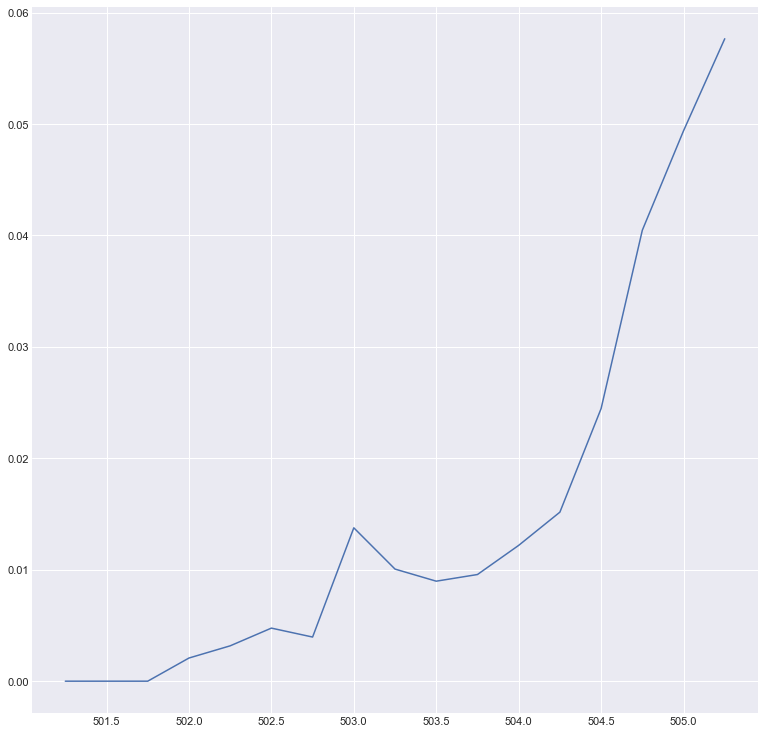

In [136]:
plt.plot(np.divide(x_p, 4), time_seq['LG'])
plt.savefig('../Graphs/Final/LGseq.png')

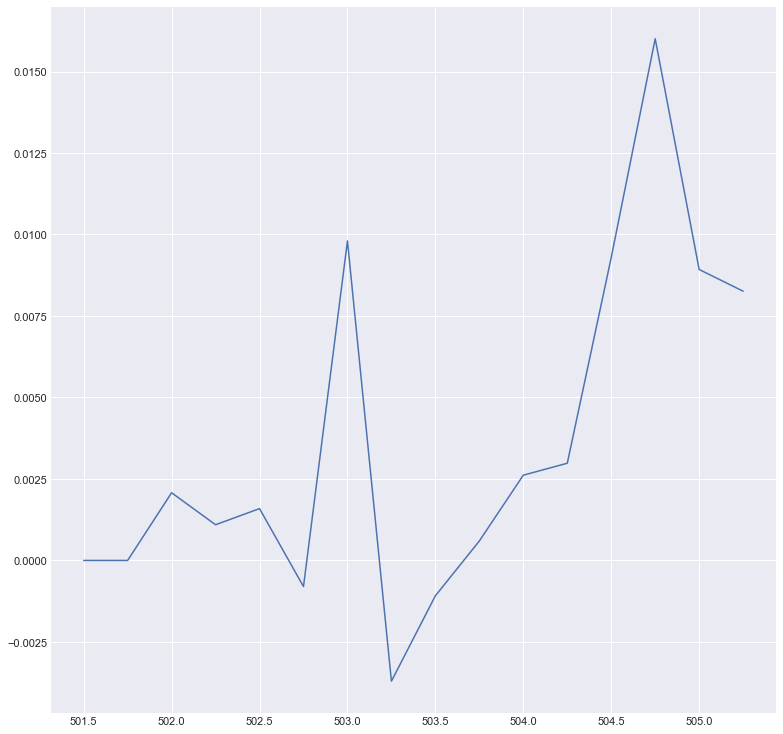

In [137]:
plt.plot(np.divide(x_p_diff, 4),time_seq_diff['LG'])
plt.savefig('../Graphs/Final/LGseqDiff.png')

In [138]:
y_p_diff = np.zeros((len(y_p), len(y_p[0])-1))
for i in range(len(y_p)):
    y_p_diff[i] = calcAdFuller(y_p[i])

0th ADF Statistic: -3.911410 p-value: 0.001952
16
1st ADF Statistic: -0.954879 p-value: 0.769363
2nd ADF Statistic: -1.734410 p-value: 0.413476
0th ADF Statistic: -2.588140 p-value: 0.095473
16
1st ADF Statistic: -7.292092 p-value: 0.000000
2nd ADF Statistic: -2.339836 p-value: 0.159442
0th ADF Statistic: 2.722795 p-value: 0.999088
16
1st ADF Statistic: 1.842643 p-value: 0.998430
2nd ADF Statistic: 10.266487 p-value: 1.000000
0th ADF Statistic: -0.348898 p-value: 0.918288
16
1st ADF Statistic: -5.512631 p-value: 0.000002
2nd ADF Statistic: -5.099103 p-value: 0.000014
0th ADF Statistic: -2.864102 p-value: 0.049685
16
1st ADF Statistic: 1.235059 p-value: 0.996219
2nd ADF Statistic: -1.962435 p-value: 0.303283
0th ADF Statistic: -2.167147 p-value: 0.218385
16
1st ADF Statistic: -2.950752 p-value: 0.039757
2nd ADF Statistic: -3.560828 p-value: 0.006556
0th ADF Statistic: -2.007278 p-value: 0.283391
16
1st ADF Statistic: -81.508724 p-value: 0.000000
2nd ADF Statistic: -2.499717 p-value: 0.1

In [1088]:
#Seasonality
from statsmodels.tsa.seasonal import seasonal_decompose
def testSeasonality(seq):
    decompose_result_mult = seasonal_decompose(seq, period=1)
    decompose_result_mult.plot()

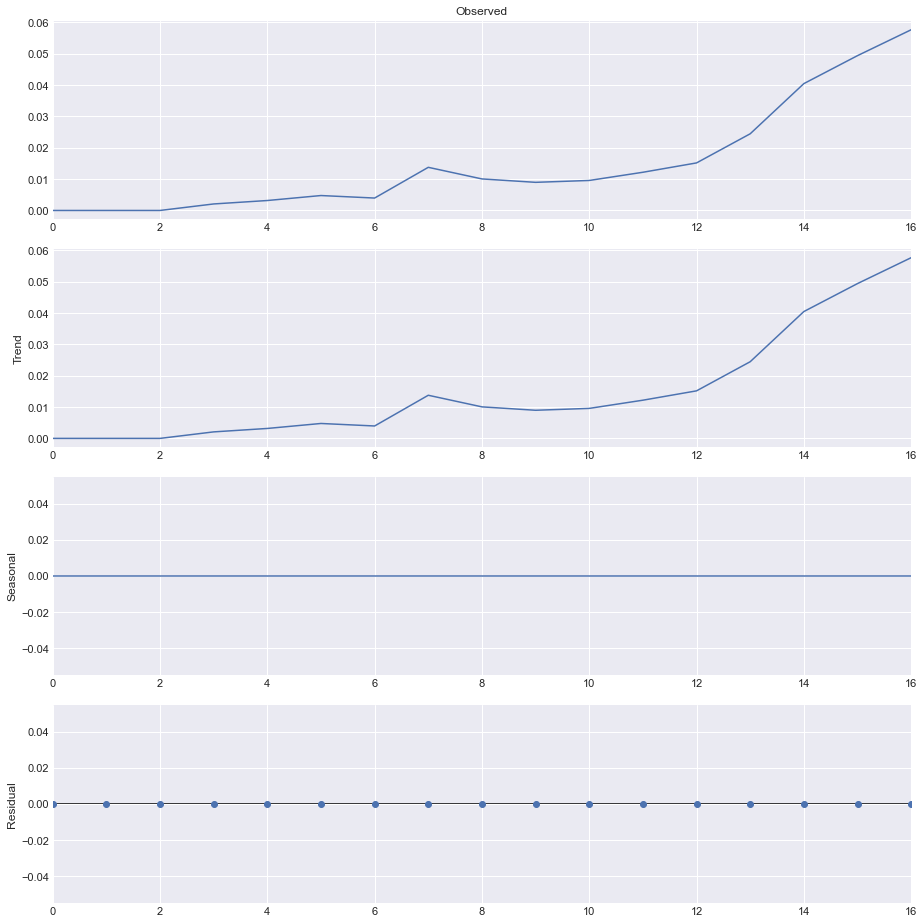

In [1090]:
testSeasonality(time_seq['LG'])
plt.savefig('../Graphs/Final/seasonality_annual.png')

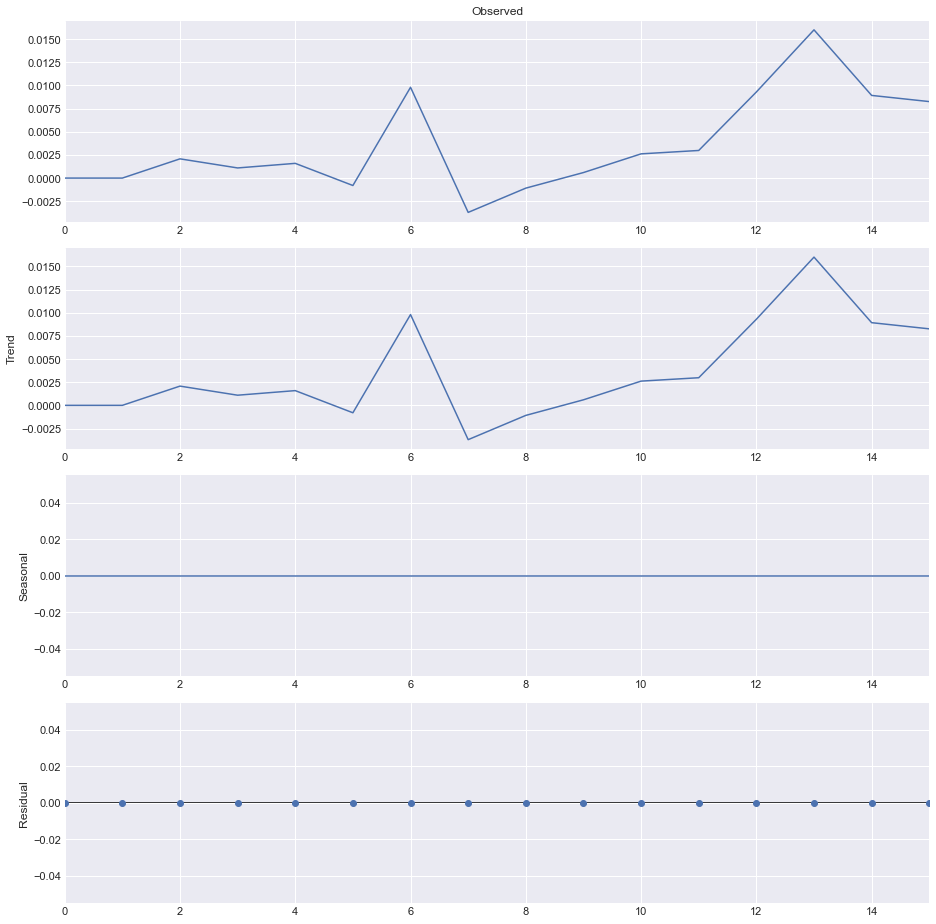

In [1091]:
testSeasonality(time_seq_diff['LG'])
plt.savefig('../Graphs/Final/seasonality_annual_diff.png')

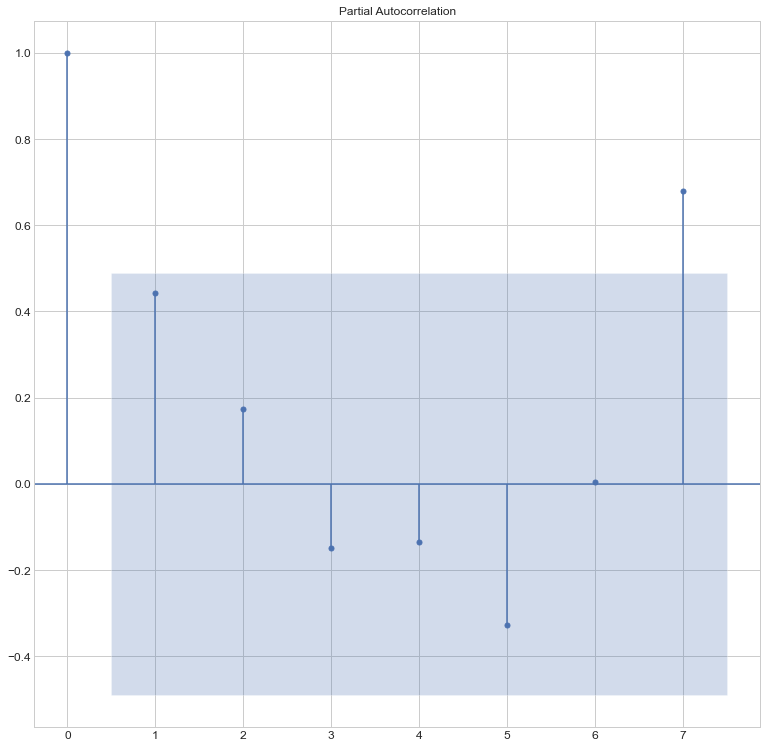

In [1339]:
# AR parameters
plot_pacf(time_seq_diff['LG'], lags = 7)
plt.savefig('../Graphs/Final/pacf_annual.png')

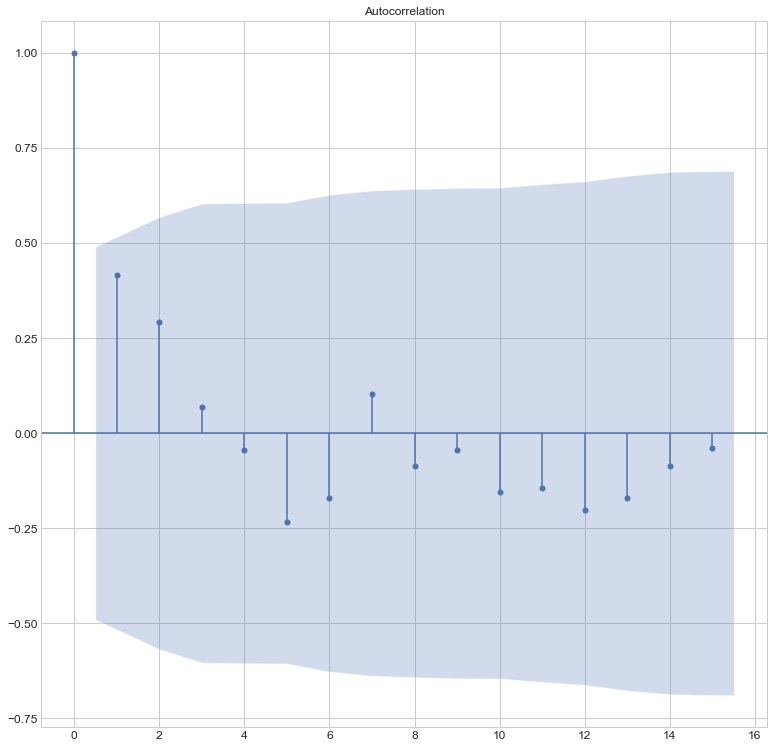

In [1340]:
# MA Parameters
plot_acf(time_seq_diff['LG'], lags = 15)
plt.savefig('../Graphs/Final/acf.png')

Time Series Analysis

In [2960]:
# Order of auto-regression
p = 0

In [2961]:
#ARIMA function
from statsmodels.tsa.arima.model import ARIMA
from math import sqrt
from sklearn.metrics import mean_squared_error
def arima_func(series):
    #Forcasting
    X = series
    size = int(len(X)-2)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()
    model = ARIMA(history, order=(p,1,0))
    model_fit = model.fit()
    fc = model_fit.forecast(len(test), alpha=0.05)
    predictions = fc

    # evaluate forecasts
    rmse = sqrt(mean_squared_error(test, predictions))
    
    return predictions, rmse, train, test

In [2962]:
def plotArima(train, test, fc):
    test = np.insert(test,0,train[-1])
    fc = np.insert(fc,0,train[-1])
    # Make as pandas series
    train_series = pd.Series(train, index =x_p[:-len(test)+1])
    train_index = train_series.index
    fc_series = pd.Series(fc, index = x_p[-len(test):])
    #lower_series = pd.Series(conf[:, 0], index=test.index)
    #upper_series = pd.Series(conf[:, 1], index=test.index)
    # Plot
    test_series = pd.Series(test, index = np.divide(x_p[-len(test):],1))
    plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick label
    plt.style.use('seaborn-whitegrid')
    plt.figure(figsize=(12,5), dpi=100)
    plt.plot(train_series, label='training')
    plt.plot(test_series, label='actual')
    plt.plot(fc_series, label='forecast')
    #plt.fill_between(lower_series.index, lower_series, upper_series, 
    #                color='k', alpha=.15)
    plt.title('Forecast vs Actuals')
    plt.legend(loc='lower right', fontsize=8)
    #plt.savefig('../Graphs/Final/linguisticAnnualLG.png')
    plt.show()

In [2963]:
def plotComparison(sequence, prediction):
    size = int(len(sequence)-len(prediction))
    test = sequence[size:len(sequence)]
    plt.figure(figsize=(12, 9), dpi=80)
    plt.style.use('seaborn-whitegrid')
    plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.plot(x_p[-len(test):], test, label='Data')
    plt.plot(x_p[-len(test):], prediction, color='red', label='Predictions')
    plt.legend(fontsize=MEDIUM_SIZE)

Baseline Predictions

In [2964]:
# ARIMA on subjects

subject_predictions_list = {}
rmse_original = {}
train = {}
test = {}

for subj in time_seq.keys():
    subject_predictions_list[subj], rmse_original[subj], train[subj], test[subj] = arima_func(time_seq[subj])

    #if(subj == 'LG'):
        #plotArima(train, test, subject_predictions_list[subj], conf)

/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/miamijovic/opt/anaconda3/

In [2965]:
sum(rmse_original.values())

0.23925727368421168

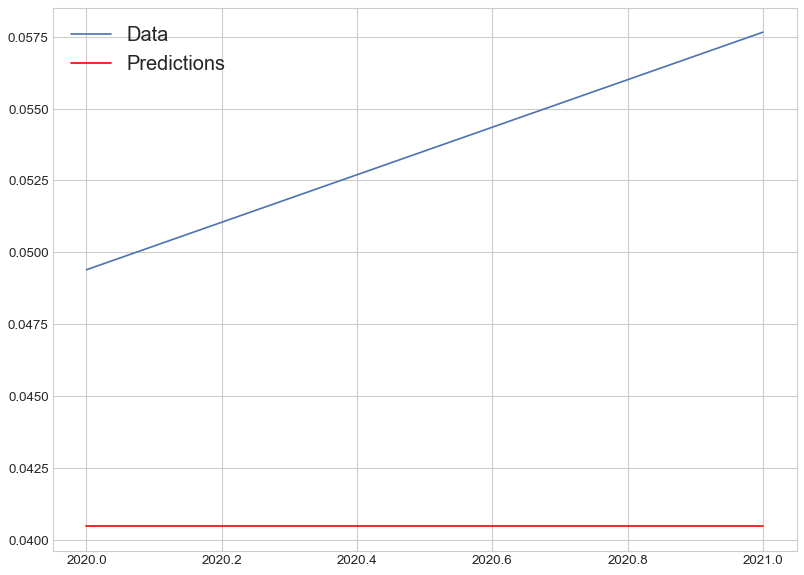

In [2966]:
plotComparison(test['LG'], subject_predictions_list['LG'])

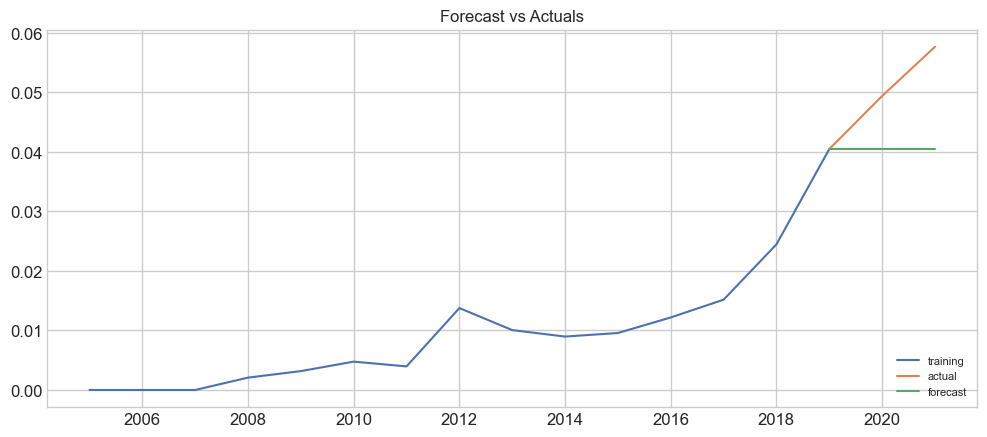

In [2967]:
plotArima(train['LG'], test['LG'], subject_predictions_list['LG'])

Method 1 - VAR
Assumes dependence

In [2968]:
from statsmodels.tsa.vector_ar.var_model import VAR

In [2969]:
#Investigate topics
#Apply differencing, AR, MA

In [2970]:
y_p_diff = np.zeros((len(y_p), len(y_p[0])-1))
for i in range(len(y_p)):
    print(i)
    y_p_diff[i] = calcAdFuller(y_p[i])

0
0th ADF Statistic: -3.911410 p-value: 0.001952
16
1st ADF Statistic: -0.954879 p-value: 0.769363
2nd ADF Statistic: -1.734410 p-value: 0.413476
1
0th ADF Statistic: -2.588140 p-value: 0.095473
16
1st ADF Statistic: -7.292092 p-value: 0.000000
2nd ADF Statistic: -2.339836 p-value: 0.159442
2
0th ADF Statistic: 2.722795 p-value: 0.999088
16
1st ADF Statistic: 1.842643 p-value: 0.998430
2nd ADF Statistic: 10.266487 p-value: 1.000000
3
0th ADF Statistic: -0.348898 p-value: 0.918288
16
1st ADF Statistic: -5.512631 p-value: 0.000002
2nd ADF Statistic: -5.099103 p-value: 0.000014
4
0th ADF Statistic: -2.864102 p-value: 0.049685
16
1st ADF Statistic: 1.235059 p-value: 0.996219
2nd ADF Statistic: -1.962435 p-value: 0.303283
5
0th ADF Statistic: -2.167147 p-value: 0.218385
16
1st ADF Statistic: -2.950752 p-value: 0.039757
2nd ADF Statistic: -3.560828 p-value: 0.006556
6
0th ADF Statistic: -2.007278 p-value: 0.283391
16
1st ADF Statistic: -81.508724 p-value: 0.000000
2nd ADF Statistic: -2.49971

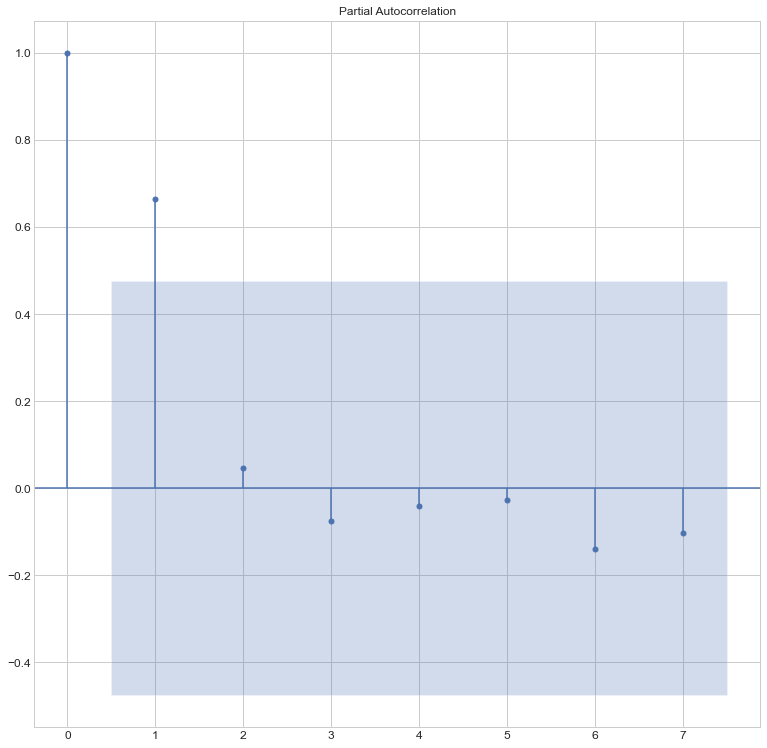

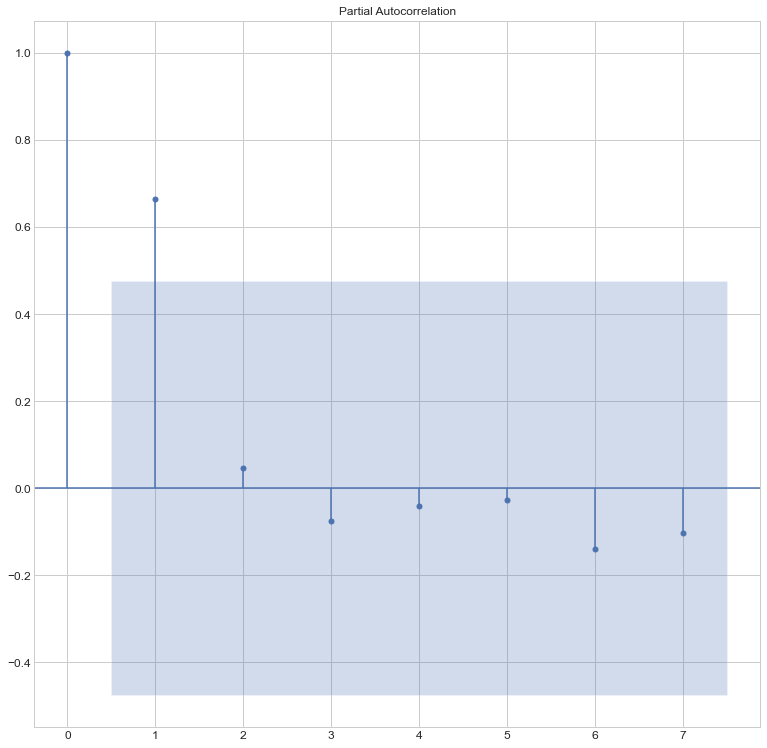

In [2971]:
plot_pacf(y_p[2], lags=7)

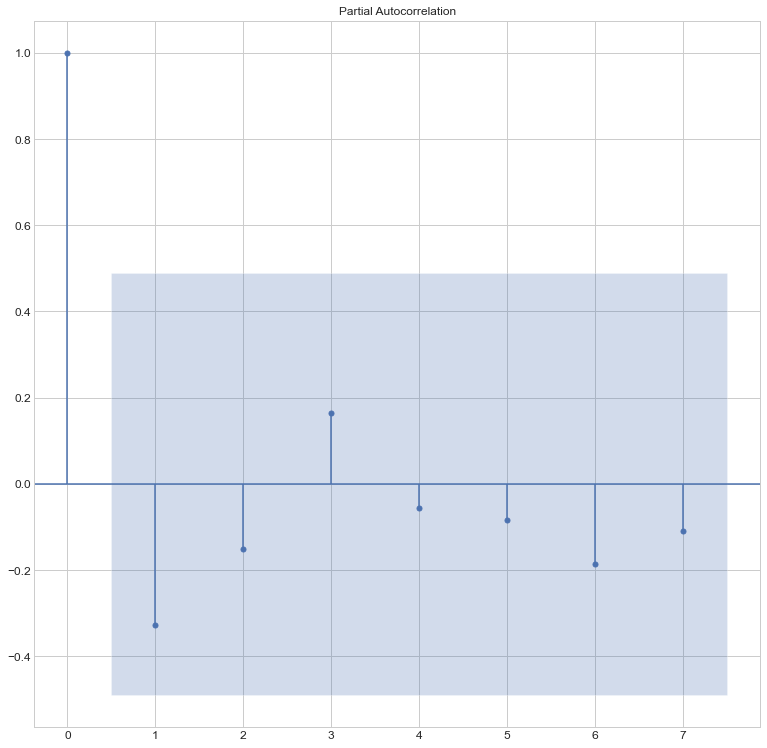

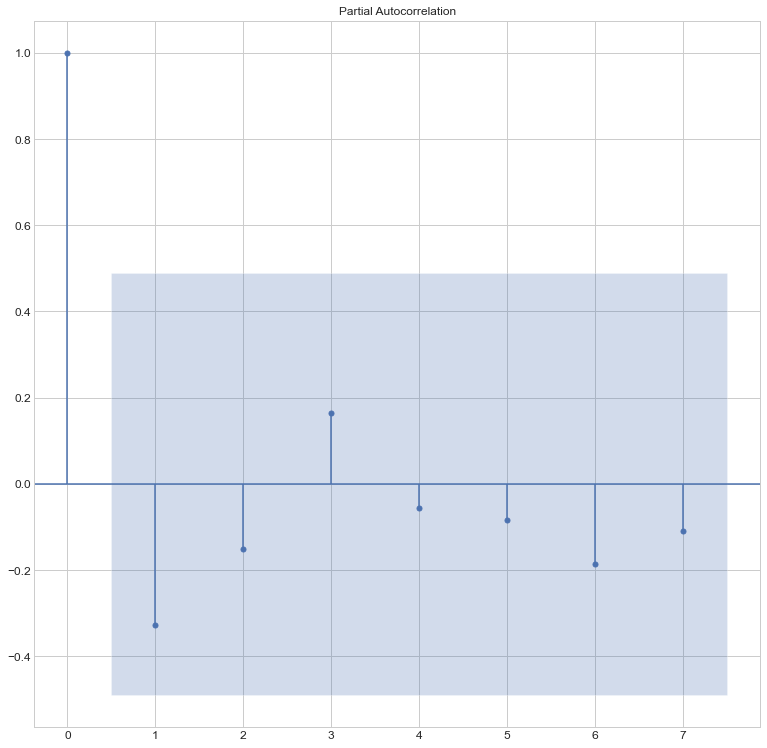

In [2972]:
plot_pacf(y_p_diff[3], lags = 7)

VAR implementation

In [2973]:
def var_func(pd_topics, cols, y):
    X = pd_topics[cols]
    indices = X.index.values.tolist()
    y_df = pd.DataFrame(y, index=indices, columns=['y'])
    X.insert(0,'y', y_df)
    size = int(len(X)-2)
    train, test = X[0:size][:], X[size:len(X)][:]
    mod = VAR(endog=train)
    model_fit = mod.fit(p)
    prediction = model_fit.forecast(model_fit.y, steps=len(test))

    pred = np.array(prediction).T
    rmse = sqrt(mean_squared_error(test['y'], pred[0]))
    return pred[0], rmse, test, train

In [2974]:
#pd_topics = pd.DataFrame(y_p_diff.T, index = x_p[1:], columns = range(k))
#pd_topics_transposed = pd_topics.T

In [2975]:
#pd_topics_full = pd.DataFrame(y_p.T, index = x_p, columns = range(k))

In [ ]:
var_pred = {}
rmse_var = {}
test_var = {}
train_var = {}
for subj in topTfIdf.keys():
    cols = list(topTfIdf[subj].keys())
    var_pred[subj], rmse_var[subj], test_var[subj], train_var[subj] = var_func(pd_topics, cols=cols, y=time_seq_diff[subj])

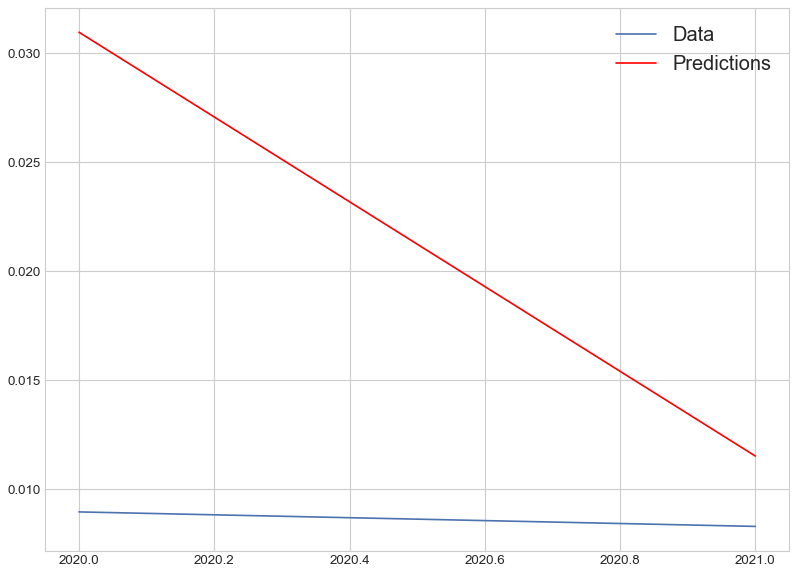

In [ ]:
plotComparison(list(test_var['LG']['y']), list(var_pred['LG']))

In [ ]:
#plotArima(list(train_var['LG']['y']), list(test_var['LG']['y']), var_pred['LG'])

In [ ]:
#Put it back from differencing

In [ ]:
def invert_transformation(train_var, var_pred, time_seq):
    """Revert back the differencing to get the forecast to original scale."""
    var_pred_full = {}
    rmse = {}
    for key in train_var.keys():
        rmse[key] = 0
        for i in range(len(var_pred[key])):
            if(i==0):
                var_pred_full[key] = np.zeros(len(var_pred[key]))
                var_pred_full[key][i] = time_seq[key][-3]+var_pred[key][i]
            else:
                var_pred_full[key][i] = var_pred_full[key][i-1] + var_pred[key][i]
        rmse[key] = sqrt(mean_squared_error(time_seq[key][-2:], var_pred_full[key]))

    return var_pred_full, rmse

In [ ]:
var_pred_full, rmse_var_full = invert_transformation(train_var, var_pred, time_seq)

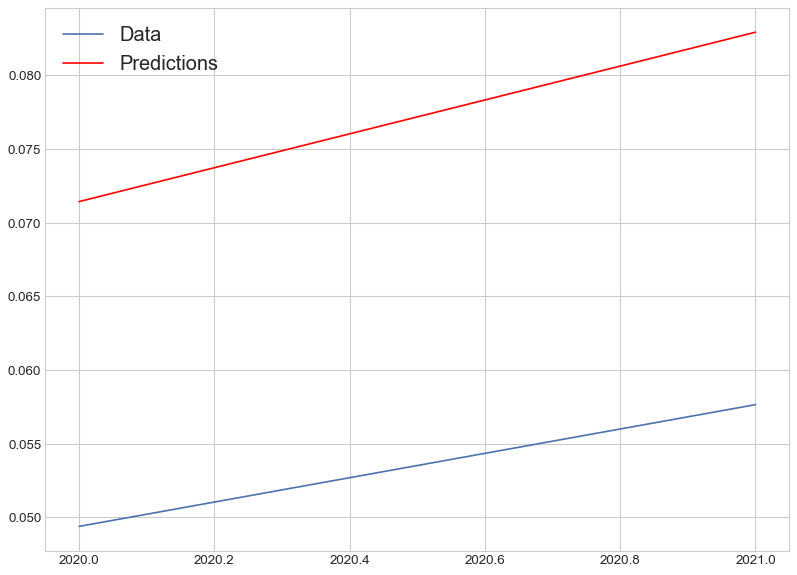

In [ ]:
plotComparison(time_seq['LG'], list(var_pred_full['LG']))

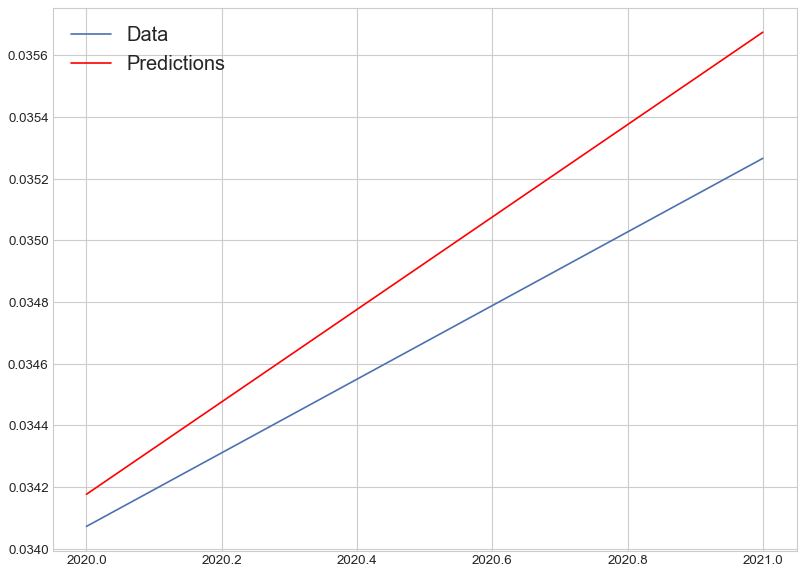

In [ ]:
plotComparison(test['IR'], subject_predictions_list['IR'])

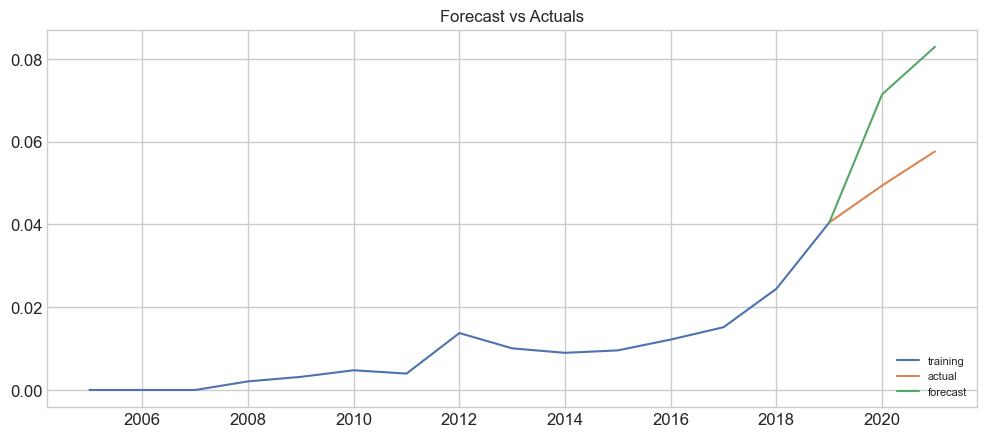

In [ ]:
plotArima(time_seq['LG'][:-2], time_seq['LG'][-2:], var_pred_full['LG'])

Comparison

In [ ]:
def compareRMSE(rmse1, rmse2):
    #rmse1 - original
    #rmse2 - one to compare
    rmse_comparison = {}
    for subj in rmse1.keys():
        rmse_comparison[subj] = rmse2[subj]-rmse1[subj]
    return rmse_comparison

In [ ]:
rmse_var_comp = compareRMSE(rmse_original, rmse_var)
rmse_var_comp

{'SD': -0.011166526492351479,
 'LG': 0.014472507122878663,
 'CL': 0.007366750411702523,
 'RO': 0.0037468539971871164,
 'CV': 0.01873250575213497,
 'HC': 0.003919018214713346,
 'SE': 0.007606205510859218,
 'CR': -0.002536242228728402,
 'IR': 0.0038378556329897,
 'AR': -0.004349518640339124,
 'CY': 0.0011974711828980408,
 'CE': 0.0019401945054951754,
 'GT': 0.008559518658744096,
 'AI': 0.011963097199365865,
 'DC': 0.007283525185540367,
 'NE': 0.010424516299124813,
 'DL': 0.025195438364995555,
 'MA': 0.00047723807268151147,
 'SI': 0.008633658071399488,
 'GR': 0.0034235564045056437,
 'CG': 0.004861221856782098,
 'DB': 0.013700926517244945,
 'PL': 0.009717137829128496,
 'DS': 0.004197449061575327,
 'FL': 0.025185917038498474,
 'LO': -0.0019717783015616615,
 'ET': -0.0001247114889177392,
 'IT': 0.009770399371288395,
 'MM': 0.003574853518497111,
 'CC': 0.019695858595829074,
 'NI': 0.004259687508871845,
 'DM': -0.0006984281897686045,
 'MS': 0.002646345506074575,
 'PF': 0.010269242542082686,
 '

In [ ]:
rmse_var_full_comp = compareRMSE(rmse_original, rmse_var_full)
rmse_var_full_comp

{'SD': -0.009250591376275891,
 'LG': 0.02243142077154117,
 'CL': 0.004960749370749482,
 'RO': 0.008634269202678516,
 'CV': 0.030880624978331543,
 'HC': 0.0016601914310445214,
 'SE': 0.01550338088135024,
 'CR': -0.001582754759227683,
 'IR': 0.0061924131642647805,
 'AR': -0.0085024177490989,
 'CY': -0.0027130937031909948,
 'CE': 0.005647320250403923,
 'GT': 0.015941800960639362,
 'AI': 0.020406793931107003,
 'DC': 0.0036088503198262395,
 'NE': 0.012362970856177616,
 'DL': 0.03287967862283072,
 'MA': 0.0022599215285271984,
 'SI': 0.016794910125878623,
 'GR': 0.006808954557955719,
 'CG': 0.006606503794440662,
 'DB': 0.019973028881230908,
 'PL': 0.01281263869912265,
 'DS': 0.00603824005476155,
 'FL': 0.042986498129552186,
 'LO': -0.0015848247803730516,
 'ET': 0.0047635459081391066,
 'IT': 0.010622320538749347,
 'MM': 0.0016335028327058689,
 'CC': 0.029001232452580343,
 'NI': 0.008710498154837855,
 'DM': 0.0015721770550464562,
 'MS': 0.0014935959495539922,
 'PF': 0.009745345085464475,
 'SC':

In [ ]:
#Full rmse
print(sum(rmse_var_full_comp.values()))
print(sum(i < 0 for i in rmse_var_full_comp.values()))

0.36306076190495856
7


Method 2 - ARIMA with Ridge Regression and no prior knowledge
Assumes independence

In [ ]:
def var_func2(y_p, time):
    X = pd.DataFrame(y_p.T)
    indices = X.index.values.tolist()
    size = int(len(X)-2)
    train, test = X[0:size][:], X[size:len(X)][:]
    mod = VAR(endog=train)
    model_fit = mod.fit(p)
    predictions = model_fit.forecast(model_fit.y, steps=len(test))
    rmse = 0
    pred = predictions.T
    return pred, rmse, test, train

In [ ]:
# Pre-process data to put it in suitable format
def formMatrices(y_p2, time_seq2):
    learningSubjects = {}
    for subj in topTfIdf.keys():
        learningSubjects[subj] = {}
        learningSubjects[subj]['y'] = time_seq2[subj]
        learningSubjects[subj]['X'] = np.zeros((len(y_p2[0]), len(topTfIdf[subj].keys())))
        i = 0
        for topic in topTfIdf[subj].keys():
            learningSubjects[subj]['X'][:,i] = y_p2[topic]
            i+=1
        #learningSubjects[subj]['X'][:,i] = time_seq2[subj][:len(learningSubjects[subj]['X'][:,i-1])]
    return learningSubjects

In [ ]:
# Ridge regression for forming weights
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression, Ridge

def weightsPrediction(learningSubjects):
    #Forcasting
    fitted_weights = {}
    offset = {}
    y_test_pred = {}
    for subj in learningSubjects.keys():
        X = learningSubjects[subj]['X']
        y = learningSubjects[subj]['y']
        size = len(X)-2
        alpha = 0.01
        # Split data into training and test sets
        X_train = X[:size]
        X_test = X[size:]
        y_train = y[:size]
        y_test = y[size:]
        
        reg = Ridge(alpha = alpha).fit(X_train, y_train)
        fitted_weights[subj] = reg.coef_
        y_train_pred = reg.predict(X_train)
        trySomething1 = np.zeros(len(y_train))
        for j in range(len(y_train)):
            for i in range(len(fitted_weights[subj])):
                trySomething1[j] += fitted_weights[subj][i]*X_train[j][i]
        y_test_pred[subj] = reg.predict(X_test)
        offset[subj] = y_train_pred[0]-trySomething1[0]
        
        if(subj == 'LG'):
            #plotComparison(y_train, trySomething1)
            plt.style.use('seaborn-whitegrid')
            plotComparison(y_train, y_train_pred)
            plt.savefig('../Graphs/Final/weightFittingTrainAnnual.png')
            plotComparison(y_train, trySomething1+offset[subj])
            plotComparison(y_test, y_test_pred[subj])
            #plt.savefig('../Graphs/Final/weightFittingTest.png')

    return fitted_weights, offset, y_test_pred

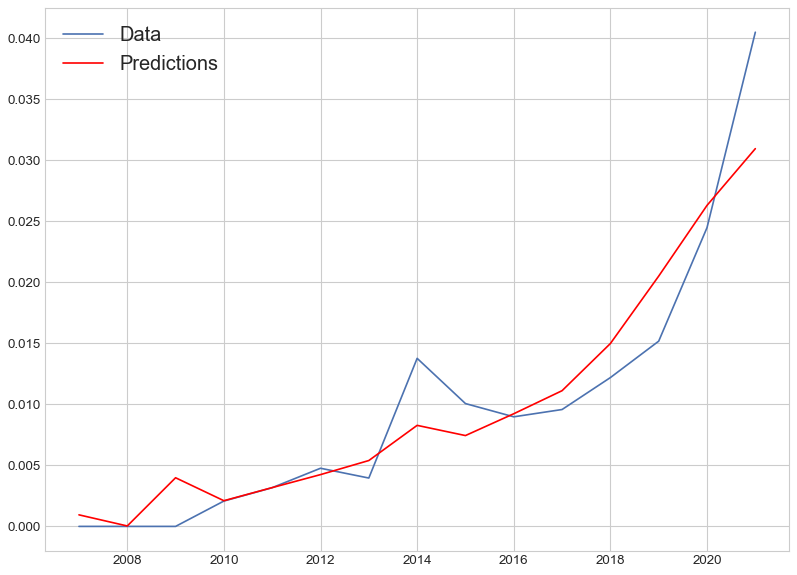

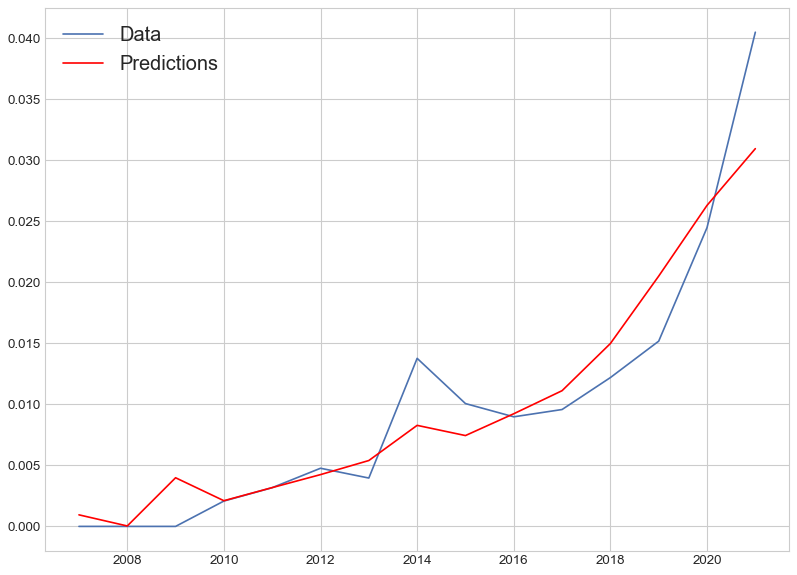

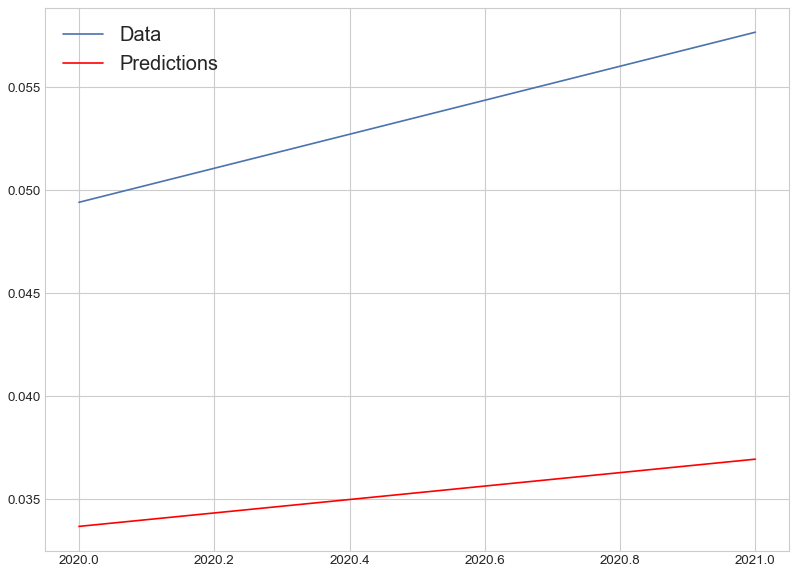

In [ ]:
learningSubjects = formMatrices(y_p, time_seq)
y_test_pred, offset, y_test_pred = weightsPrediction(learningSubjects)

In [ ]:
def formFittedWeightsDict(fitted_weights, topTfIdf):
    weights_dict = {}
    for subj in topTfIdf.keys():
        i = 0
        weights_dict[subj] = {}
        for topic in topTfIdf[subj].keys():
            weights_dict[subj][topic] = fitted_weights[subj][i]
            i += 1
    return weights_dict

In [ ]:
weights_dict = formFittedWeightsDict(fitted_weights, topTfIdf)

In [ ]:
def doTopicPredictions(y_p):
    topic_predictions = np.zeros((len(y_p),2))
    topic_predictions, rmse_var_topics, test_var_topics, train_var_topics = var_func2(y_p, 2)
    return topic_predictions, rmse_var_topics, test_var_topics, train_var_topics

In [ ]:
topic_predictions, rmse_var_topics, test_var_topics, train_var_topics = doTopicPredictions(y_p)

/Users/miamijovic/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/wrapper.py:34: FutureWarning: y is a deprecated alias for endog, will be removed in version 0.11.0
  obj = getattr(results, attr)


In [ ]:
#def doTopicPredictions(y_p, y2y, time_period, auto):
#    #Form an arima seqence for the topics
#    topic_predictions = np.zeros((len(y_p),time_period))
#    for topic in range(len(y_p)):
#        topic_predictions[topic], rmseirr, trainirr, testirr = arima_func(y_p[topic])
#    return topic_predictions

In [ ]:
##topic_predictions = doTopicPredictions(y_p, True, 2, True)

In [ ]:
def predict(y_p, time_seq, topic_predictions, weights_dict, time_period):
    total_years = len(y_p[0])

    #Form subject predictions
    subject_seq = {}
    for subject in topTfIdf.keys():
        subject_seq[subject] = np.zeros(time_period)
        for topic in topTfIdf[subject].keys():
            subject_seq[subject] += np.array(topic_predictions[topic])*weights_dict[subject][topic]   
        subject_seq[subject] += offset[subject]
            
    rmse = {}
    index = len(time_seq['AI'])-time_period+1
    for subj in subject_seq.keys():
        rmse[subj] = sqrt(mean_squared_error(time_seq[subj][index:], subject_seq[subj][1:]))

    return subject_seq, rmse

In [ ]:
offset['CL']

-0.004831988688821736

In [ ]:
subject_seq_weighted, rmse_weighted = predict(y_p, time_seq, topic_predictions, weights_dict, 2)

In [ ]:
subject_seq_weighted2 = y_test_pred

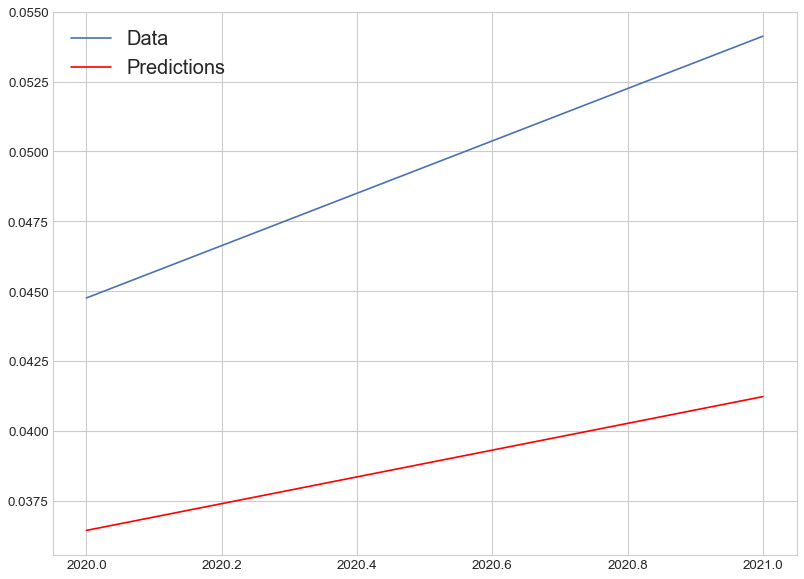

In [ ]:
plotComparison(time_seq['CL'],subject_seq_weighted2['CL'])

In [ ]:
def calculateRMSE(time_seq, subject_seq_weighted2):
    rmse = {}
    for subj in subject_seq_weighted2.keys():
        rmse[subj] = sqrt(mean_squared_error(subject_seq_weighted2[subj], time_seq[subj][-2:]))
    return rmse

In [ ]:
rmse_ling = calculateRMSE(time_seq, subject_seq_weighted)
print(sum(rmse_ling.values()))

0.3024694538022408


In [ ]:
rmse_comp_weight = compareRMSE(rmse_original, rmse_weighted)
rmse_comp_weight

{'SD': -0.003945249919170283,
 'LG': 0.01739849288359396,
 'CL': 0.008746554334405228,
 'RO': 0.005332540594128954,
 'CV': 0.004219283638488515,
 'HC': 0.004031334858948689,
 'SE': 0.0031056484437009405,
 'CR': 0.008084808815571089,
 'IR': -2.082374514750414e-05,
 'AR': -0.012931999270551137,
 'CY': -0.007588918644101718,
 'CE': -0.0041990050290026245,
 'GT': -0.0028782112277994333,
 'AI': 0.002467223630841471,
 'DC': -0.0012226964305698512,
 'NE': 0.0028657976473828875,
 'DL': -0.0010727878700756551,
 'MA': 7.418654111545839e-05,
 'SI': 0.00907546698853204,
 'GR': -0.004298077224274067,
 'CG': 0.006592659459230011,
 'DB': -0.0010821960363881175,
 'PL': 0.001370013480061224,
 'DS': 0.0006487769243827255,
 'FL': -9.979233757732592e-05,
 'LO': 0.0042068472127969325,
 'ET': 0.005118933227537131,
 'IT': 0.005443413455729414,
 'MM': 0.003901366463358623,
 'CC': 0.008456102776042041,
 'NI': 0.005519616121064801,
 'DM': 0.01374348064411193,
 'MS': 0.001364125128766948,
 'PF': -0.0003934348824

In [ ]:
print(sum(rmse_comp_weight.values()))
print(sum(i < 0 for i in rmse_comp_weight.values()))

0.12039611705531757
15


In [ ]:
rmse_comp_weight2 = compareRMSE(rmse_original, rmse_ling)
print(sum(rmse_comp_weight2.values()))
print(sum(i < 0 for i in rmse_comp_weight2.values()))

0.10401083346700879
15


Comparison

In [ ]:
SMALL_SIZE = 12
MEDIUM_SIZE = 18

In [ ]:
mrr = MRR(y_pred_classes, y_test, classes)
mrr2 = MRR(y_pred_classes2, y_test2, classes2)
print(mrr, mrr2)

0.6222708357350348 0.622700613369949


In [ ]:
plt.rcParams['legend.fontsize'] = MEDIUM_SIZE

In [ ]:
def plotComparisonAll2(sequence, prediction1, prediction2, prediction3):
    size = int(len(sequence)-len(prediction1))
    test = sequence[size:len(sequence)]
    plt.figure(figsize=(12, 9), dpi=80)
    plt.style.use('seaborn-whitegrid')
    plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.plot([2021, 2022], test, label='Data')
    plt.plot([2021, 2022], prediction1, color='red', label='Baseline Prediction')
    plt.plot([2021, 2022], prediction2, color='purple', label='Lingustic Prediction')
    plt.plot([2021, 2022], prediction3, color='orange', label='Combined Prediction')
    plt.legend(fontsize=MEDIUM_SIZE)
    plt.savefig('../Graphs/Final/4comparisonCVannual.png')
    

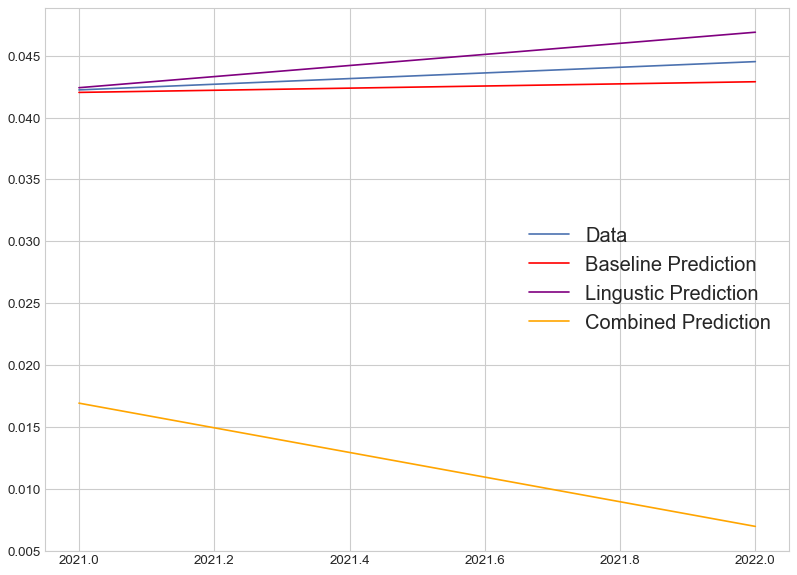

In [ ]:
plotComparisonAll2(time_seq['CV'], subject_predictions_list['CV'], subject_seq_weighted2['CV'], list(var_pred_full['CV']))

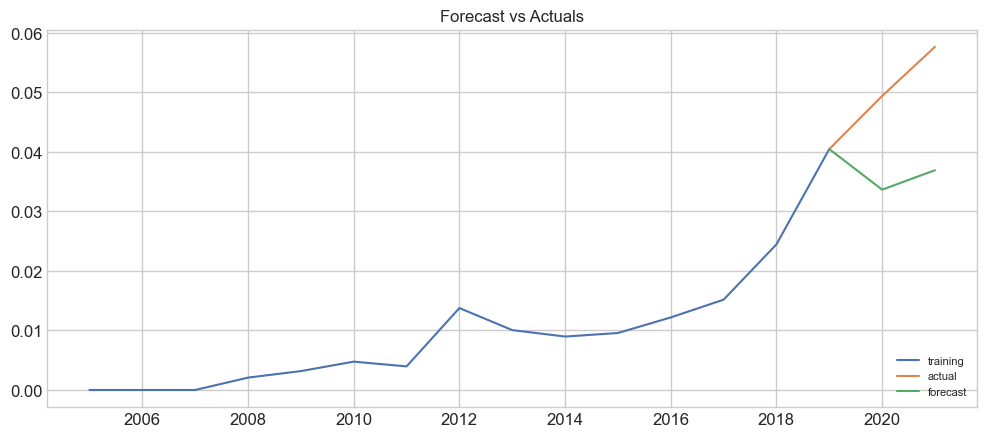

In [ ]:
plotArima(train['LG'], test['LG'], subject_seq_weighted2['LG'])

RMSE

In [ ]:
print(sum(rmse_original.values()), 'ORIGINAL')
print(sum(rmse_var_full.values()), sum(i < 0 for i in rmse_var_full_comp.values()), 'COMBINED')
print(sum(rmse_ling.values()), sum(i < 0 for i in rmse_comp_weight.values()), 'LINGUISTIC')

0.19845862033523196 ORIGINAL
0.5615193822401906 7 COMBINED
0.3024694538022408 15 LINGUISTIC
